# Stochastic Methods

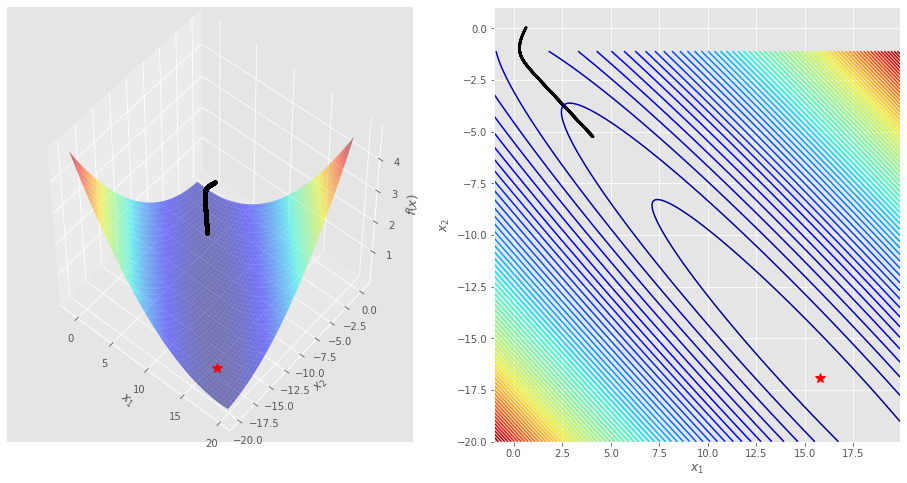

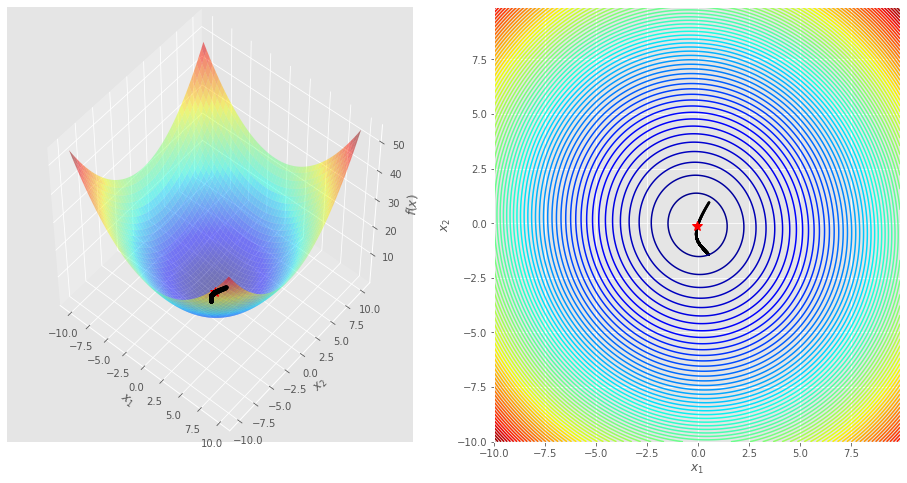

In [3]:
from optimization.optimization_function import Quadratic, Rosenbrock
from optimization.unconstrained.stochastic import *

quad = Quadratic(Q=[[5, -3], [-3, 5]], q=[10, 5])
rosen = Rosenbrock()

from ml.neural_network.losses import MeanSquaredError
from ml.linear_models import LinearRegression
from ml.regularizers import L2
import numpy as np

# generating sine curve and uniform noise
x = np.linspace(0, 1, 40)
noise = 1 * np.random.uniform(size=40)
y = np.sin(x * 1.5 * np.pi)
y += noise

# centering the y data to avoid fit the intercept
y_noise = y_noise - y_noise.mean()

# design matrix is 2x, x^2
X = np.vstack((2 * x, x ** 2)).T

# nornalizing the design matrix to facilitate visualization
X = X / np.linalg.norm(X, axis=0)

## Stochastic Gradient Descent

iter	f(x)		||g(x)||	f(x) - f*	rate
   0	3.0000e+00	1.3153e+01	3.1906e+01
  50	-2.5175e+01	3.8645e+00	3.7308e+00	1.1693e-01
 100	-2.8412e+01	1.4066e+00	4.9466e-01	1.3259e-01
 150	-2.8841e+01	5.1226e-01	6.5602e-02	1.3262e-01
 200	-2.8898e+01	1.8655e-01	8.7001e-03	1.3262e-01
 250	-2.8905e+01	6.7935e-02	1.1538e-03	1.3262e-01
 300	-2.8906e+01	2.4740e-02	1.5302e-04	1.3262e-01
 350	-2.8906e+01	9.0095e-03	2.0293e-05	1.3262e-01
 400	-2.8906e+01	3.2810e-03	2.6912e-06	1.3262e-01
 450	-2.8906e+01	1.1948e-03	3.5691e-07	1.3262e-01
 500	-2.8906e+01	4.3513e-04	4.7333e-08	1.3262e-01
 550	-2.8906e+01	1.5846e-04	6.2773e-09	1.3262e-01
 600	-2.8906e+01	5.7706e-05	8.3250e-10	1.3262e-01
 650	-2.8906e+01	2.1015e-05	1.1041e-10	1.3262e-01
 700	-2.8906e+01	7.6530e-06	1.4634e-11	1.3254e-01
 750	-2.8906e+01	2.7870e-06	1.9433e-12	1.3280e-01
 800	-2.8906e+01	1.0149e-06	2.5224e-13	1.2980e-01


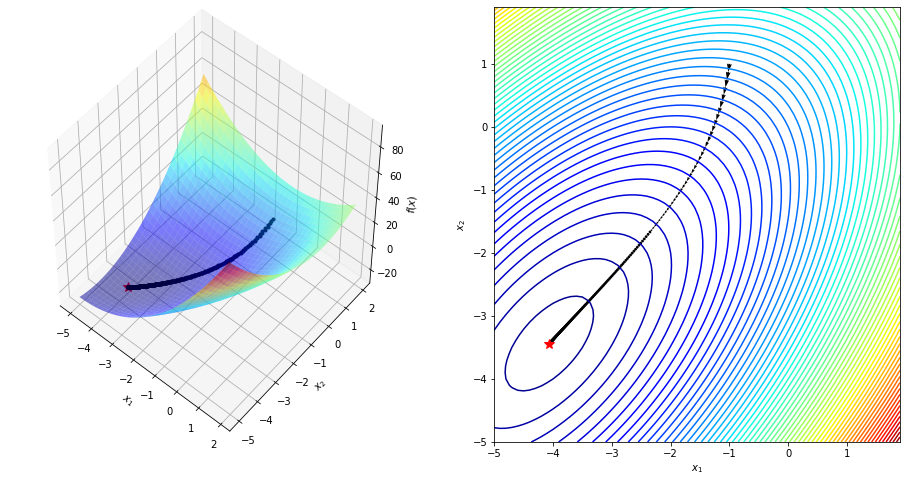

(array([-4.06249965, -3.43749965]), -28.90624999999975, 'optimal')

In [7]:
StochasticGradientDescent(f=quad, x=[-1, 1], verbose=50, plot=True).minimize()

iter	f(x)		||g(x)||	f(x) - f*	rate
   0	3.0000e+00	1.3153e+01	3.1906e+01
  50	-2.8906e+01	3.1665e-02	2.1699e-04	6.8009e-06
 100	-2.8906e+01	2.2627e-04	1.1316e-08	5.2148e-05


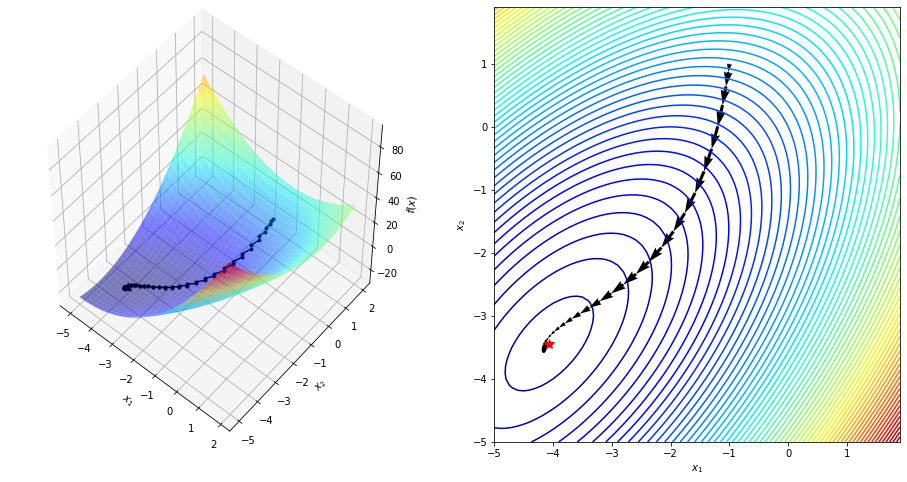

(array([-4.06249971, -3.43749981]), -28.906249999999865, 'optimal')

In [8]:
StochasticGradientDescent(f=quad, x=[-1, 1], momentum_type='standard', momentum=0.8, verbose=50, plot=True).minimize()

iter	f(x)		||g(x)||	f(x) - f*	rate
   0	3.0000e+00	1.3153e+01	3.1906e+01
  50	-2.8906e+01	3.6457e-02	3.2959e-04	1.0330e-05
 100	-2.8906e+01	5.5869e-06	7.5779e-12	2.2992e-08


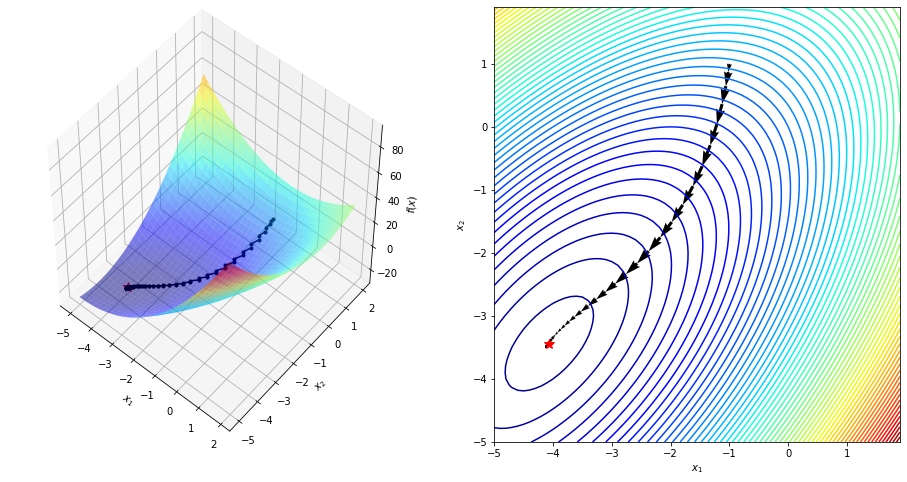

(array([-4.06250034, -3.43750034]), -28.90624999999976, 'optimal')

In [9]:
StochasticGradientDescent(f=quad, x=[-1, 1], momentum_type='nesterov', momentum=0.8, verbose=50, plot=True).minimize()

iter	f(x)		||g(x)||	f(x) - f*	rate
   0	4.0000e+00	4.0000e+00	4.0000e+00
  50	1.5096e+00	2.2946e+00	1.5096e+00	3.7741e-01
 100	2.2912e-01	6.2075e-01	2.2912e-01	1.5177e-01
 150	1.1344e-01	3.7597e-01	1.1344e-01	4.9512e-01
 200	6.3446e-02	2.6247e-01	6.3446e-02	5.5928e-01
 250	3.7756e-02	1.9346e-01	3.7756e-02	5.9508e-01
 300	2.3351e-02	1.4732e-01	2.3351e-02	6.1847e-01
 350	1.4823e-02	1.1462e-01	1.4823e-02	6.3479e-01
 400	9.5857e-03	9.0520e-02	9.5857e-03	6.4668e-01
 450	6.2845e-03	7.2276e-02	6.2845e-03	6.5561e-01
 500	4.1633e-03	5.8183e-02	4.1633e-03	6.6247e-01
 550	2.7803e-03	4.7133e-02	2.7803e-03	6.6781e-01
 600	1.8685e-03	3.8369e-02	1.8685e-03	6.7204e-01
 650	1.2620e-03	3.1354e-02	1.2620e-03	6.7541e-01
 700	8.5577e-04	2.5701e-02	8.5577e-04	6.7812e-01
 750	5.8219e-04	2.1119e-02	5.8219e-04	6.8031e-01
 800	3.9711e-04	1.7389e-02	3.9711e-04	6.8209e-01
 850	2.7144e-04	1.4340e-02	2.7144e-04	6.8355e-01
 900	1.8587e-04	1.1842e-02	1.8587e-04	6.8474e-01
 950	1.2745e-04	9.7894e-03	1.2745e-04	6.8571e

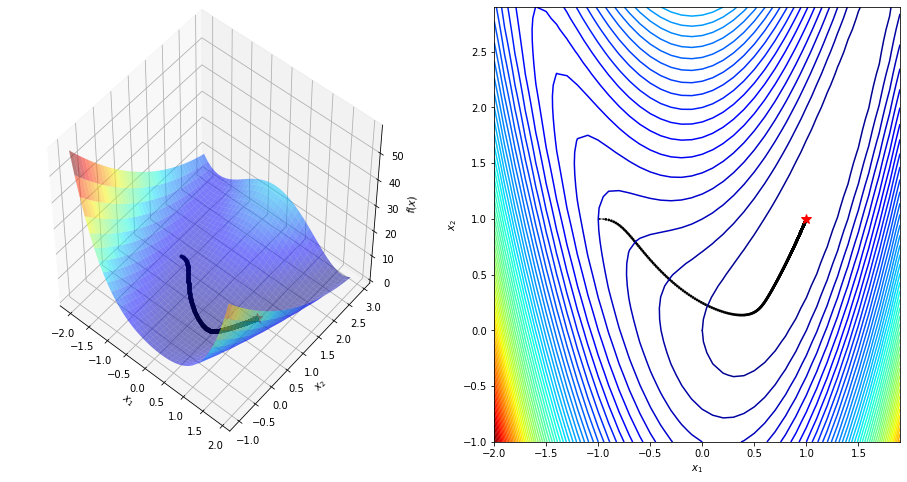

(array([0.99101597, 0.98027092]), 8.749678455831165e-05, 'stopped')

In [10]:
StochasticGradientDescent(f=rosen, x=[-1, 1], verbose=50, plot=True).minimize()

iter	f(x)		||g(x)||	f(x) - f*	rate
   0	4.0000e+00	4.0000e+00	4.0000e+00
  25	3.3600e-01	1.1731e+00	3.3600e-01	8.4000e-02
  50	2.0388e-02	6.6705e-01	2.0388e-02	6.0678e-02
  75	4.3583e-04	1.3190e-01	4.3583e-04	2.1377e-02
 100	1.7075e-04	8.1686e-02	1.7075e-04	3.9179e-01
 125	2.0566e-05	2.7429e-02	2.0566e-05	1.2044e-01
 150	1.1007e-06	6.5158e-03	1.1007e-06	5.3521e-02
 175	2.0518e-08	9.4164e-04	2.0518e-08	1.8641e-02
 200	7.6463e-10	5.2842e-05	7.6463e-10	3.7266e-02
 225	2.6776e-10	8.9170e-05	2.6776e-10	3.5018e-01
 250	3.2227e-11	3.6208e-05	3.2227e-11	1.2036e-01
 275	2.2296e-12	9.7640e-06	2.2296e-12	6.9185e-02


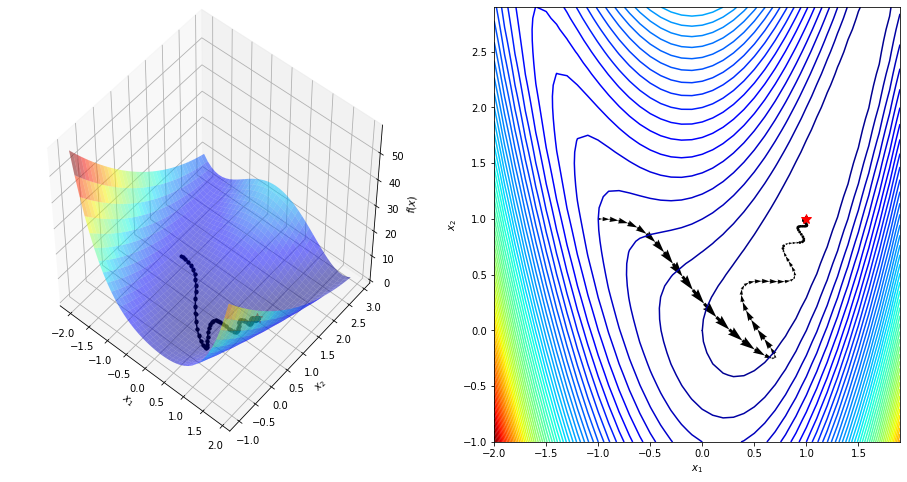

(array([1.00000017, 1.00000043]), 4.648932764152572e-14, 'optimal')

In [11]:
StochasticGradientDescent(f=rosen, x=[-1, 1], momentum_type='standard', momentum=0.9, verbose=25, plot=True).minimize()

iter	f(x)		||g(x)||	f(x) - f*	rate
   0	4.0000e+00	4.0000e+00	4.0000e+00
  25	2.1488e-01	6.2929e-01	2.1488e-01	5.3721e-02
  50	2.7962e-03	7.3279e-02	2.7962e-03	1.3013e-02
  75	9.5483e-05	8.3541e-03	9.5483e-05	3.4147e-02
 100	4.9366e-05	6.0123e-03	4.9366e-05	5.1702e-01
 125	3.9543e-06	1.7078e-03	3.9543e-06	8.0101e-02
 150	7.7019e-08	2.3864e-04	7.7019e-08	1.9478e-02
 175	7.5622e-10	2.3652e-05	7.5622e-10	9.8185e-03
 200	8.0264e-10	2.4367e-05	8.0264e-10	1.0614e+00
 225	7.5287e-11	7.4626e-06	7.5287e-11	9.3799e-02
 250	1.8353e-12	1.1652e-06	1.8353e-12	2.4377e-02


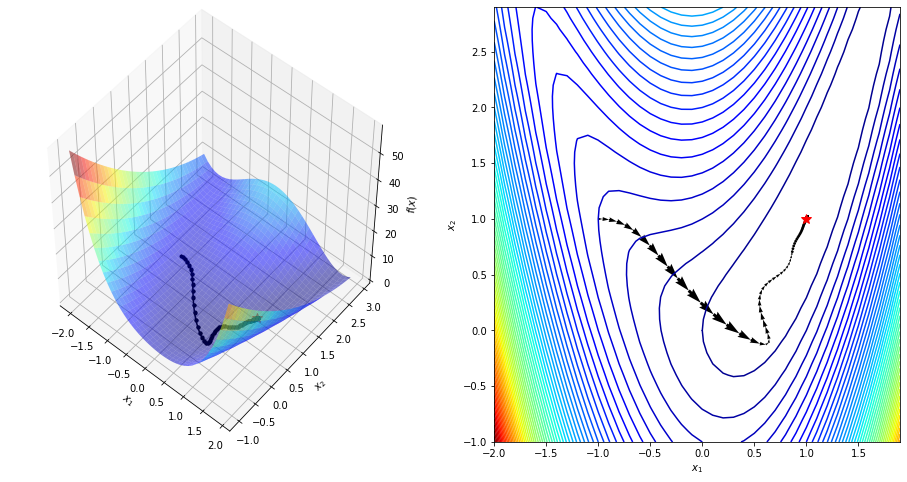

(array([0.99999893, 0.99999764]), 1.241679611191228e-12, 'optimal')

In [12]:
StochasticGradientDescent(f=rosen, x=[-1, 1], momentum_type='nesterov', momentum=0.9, verbose=25, plot=True).minimize()

## Adam

iter	f(x)		||g(x)||	f(x) - f*	rate
   0	3.0000e+00	1.3153e+01	3.1906e+01
  50	-2.8539e+01	1.4623e+00	3.6771e-01	1.1525e-02
 100	-2.8903e+01	1.3318e-01	3.0087e-03	8.1822e-03
 150	-2.8906e+01	9.8497e-03	1.5661e-05	5.2053e-03
 200	-2.8906e+01	5.1305e-04	4.1653e-08	2.6597e-03
 250	-2.8906e+01	1.0432e-05	2.1100e-11	5.0655e-04


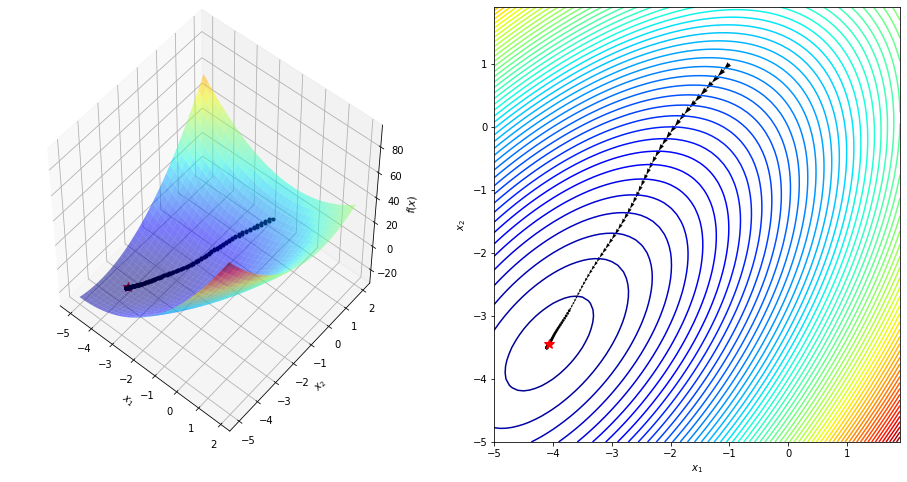

(array([-4.06250003, -3.43750013]), -28.90624999999997, 'optimal')

In [13]:
Adam(f=quad, x=[-1, 1], step_size=0.1, verbose=50, plot=True).minimize()

iter	f(x)		||g(x)||	f(x) - f*	rate
   0	3.0000e+00	1.3153e+01	3.1906e+01
  50	-2.8906e+01	5.4243e-02	5.3830e-04	1.6871e-05
 100	-2.8906e+01	4.7336e-02	2.7755e-04	5.1561e-01
 150	-2.8906e+01	9.2496e-03	1.2437e-05	4.4810e-02
 200	-2.8906e+01	1.5029e-03	1.5095e-07	1.2137e-02
 250	-2.8906e+01	5.0669e-04	1.6832e-08	1.1151e-01
 300	-2.8906e+01	1.0730e-04	8.5466e-10	5.0776e-02


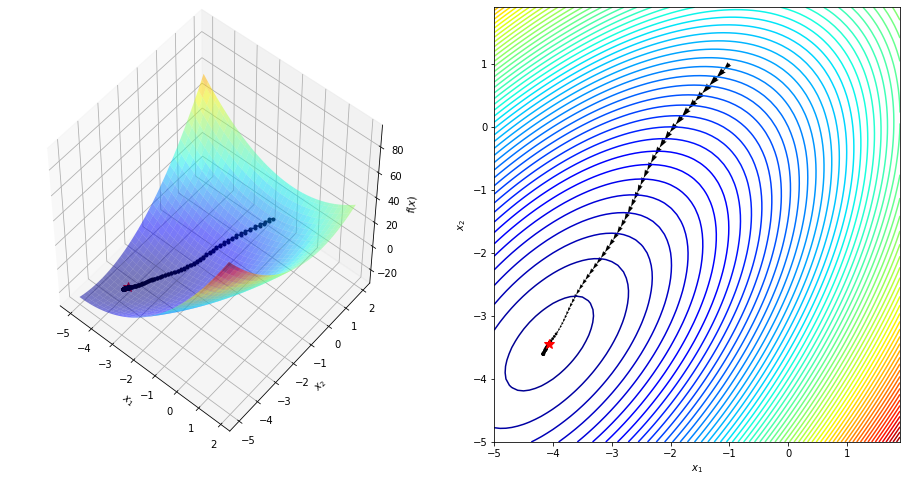

(array([-4.06249993, -3.43750003]), -28.906249999999982, 'optimal')

In [14]:
Adam(f=quad, x=[-1, 1], step_size=0.1, momentum_type='standard', momentum=0.2, verbose=50, plot=True).minimize()

iter	f(x)		||g(x)||	f(x) - f*	rate
   0	3.0000e+00	1.3153e+01	3.1906e+01
  50	-2.8906e+01	4.1584e-02	2.0887e-04	6.5464e-06
 100	-2.8906e+01	3.8985e-02	2.1384e-04	1.0238e+00
 150	-2.8906e+01	8.0417e-03	9.9248e-06	4.6413e-02
 200	-2.8906e+01	1.0925e-04	2.5332e-09	2.5524e-04
 250	-2.8906e+01	4.0567e-05	3.1325e-10	1.2366e-01


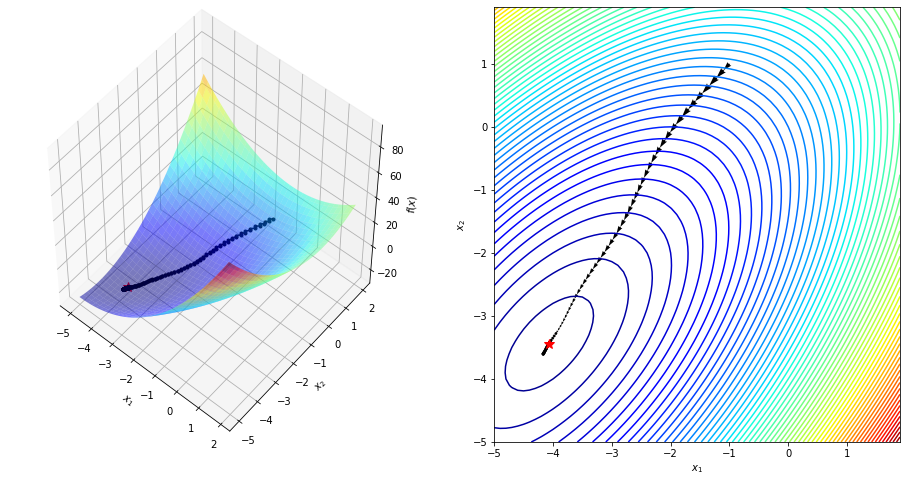

(array([-4.06250034, -3.43750026]), -28.906249999999808, 'optimal')

In [15]:
Adam(f=quad, x=[-1, 1], step_size=0.1, momentum_type='nesterov', momentum=0.2, verbose=50, plot=True).minimize()

iter	f(x)		||g(x)||	f(x) - f*	rate
   0	4.0000e+00	4.0000e+00	4.0000e+00
  50	2.4293e+00	2.4639e+00	2.4293e+00	6.0733e-01
 100	1.1927e+00	2.1643e+00	1.1927e+00	4.9096e-01
 150	4.9862e-01	1.3156e+00	4.9862e-01	4.1806e-01
 200	2.0527e-01	7.3487e-01	2.0527e-01	4.1168e-01
 250	8.5965e-02	4.2712e-01	8.5965e-02	4.1878e-01
 300	3.5996e-02	2.5690e-01	3.5996e-02	4.1873e-01
 350	1.4781e-02	1.5680e-01	1.4781e-02	4.1063e-01
 400	5.8666e-03	9.5672e-02	5.8666e-03	3.9690e-01
 450	2.2269e-03	5.7729e-02	2.2269e-03	3.7959e-01
 500	8.0200e-04	3.4187e-02	8.0200e-04	3.6014e-01
 550	2.7234e-04	1.9757e-02	2.7234e-04	3.3958e-01
 600	8.6774e-05	1.1097e-02	8.6774e-05	3.1862e-01
 650	2.5840e-05	6.0376e-03	2.5840e-05	2.9778e-01
 700	7.1677e-06	3.1746e-03	7.1677e-06	2.7739e-01
 750	1.8469e-06	1.6100e-03	1.8469e-06	2.5767e-01
 800	4.4092e-07	7.8628e-04	4.4092e-07	2.3874e-01
 850	9.7288e-08	3.6925e-04	9.7288e-08	2.2065e-01
 900	1.9791e-08	1.6652e-04	1.9791e-08	2.0343e-01
 950	3.7020e-09	7.2018e-05	3.7020e-09	1.8706e

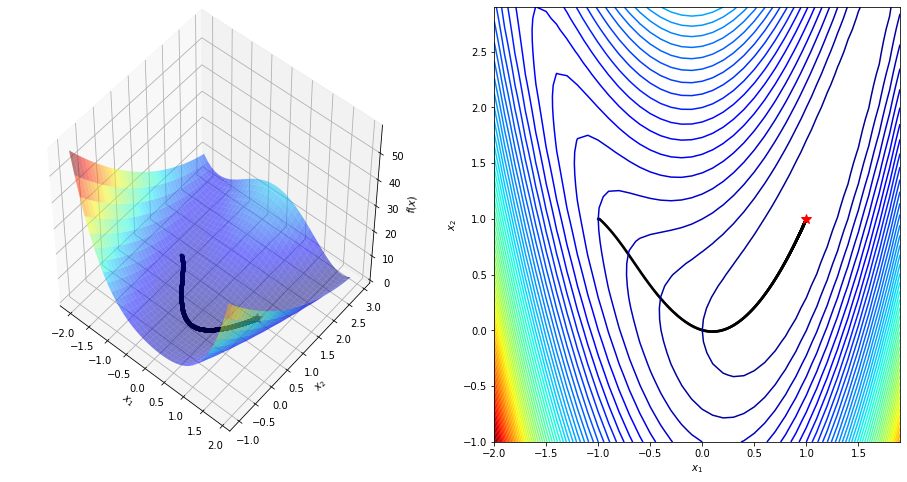

(array([0.99997511, 0.99994745]), 6.349589587946202e-10, 'stopped')

In [16]:
Adam(f=rosen, x=[-1, 1], step_size=0.01, verbose=50, plot=True).minimize()

iter	f(x)		||g(x)||	f(x) - f*	rate
   0	4.0000e+00	4.0000e+00	4.0000e+00
  50	1.2353e+00	2.1994e+00	1.2353e+00	3.0884e-01
 100	1.8404e-01	6.3995e-01	1.8404e-01	1.4898e-01
 150	3.0172e-02	2.1008e-01	3.0172e-02	1.6394e-01
 200	5.1271e-03	8.0085e-02	5.1271e-03	1.6993e-01
 250	7.6226e-04	2.9582e-02	7.6226e-04	1.4867e-01
 300	9.1743e-05	1.0195e-02	9.1743e-05	1.2036e-01
 350	8.5121e-06	3.1020e-03	8.5121e-06	9.2782e-02
 400	5.8493e-07	8.1080e-04	5.8493e-07	6.8718e-02
 450	2.8550e-08	1.7635e-04	2.8550e-08	4.8810e-02
 500	9.3690e-10	3.0398e-05	9.3690e-10	3.2816e-02
 550	1.8901e-11	4.5749e-06	1.8901e-11	2.0174e-02


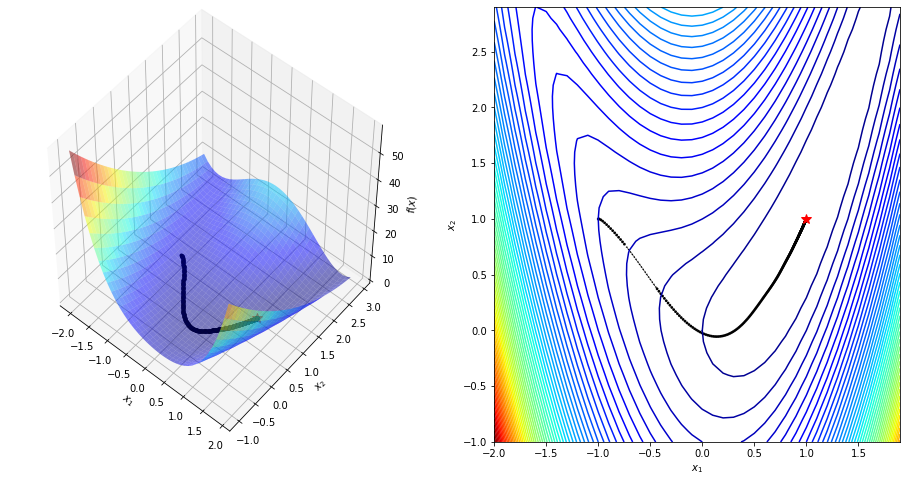

(array([0.99999906, 0.99999796]), 9.3185382971172e-13, 'optimal')

In [17]:
Adam(f=rosen, x=[-1, 1], step_size=0.01, momentum_type='standard', momentum=0.5, verbose=50, plot=True).minimize()

iter	f(x)		||g(x)||	f(x) - f*	rate
   0	4.0000e+00	4.0000e+00	4.0000e+00
  50	8.1738e-01	1.7568e+00	8.1738e-01	2.0435e-01
 100	6.9628e-02	3.0844e-01	6.9628e-02	8.5185e-02
 150	7.4432e-03	1.0106e-01	7.4432e-03	1.0690e-01
 200	7.1974e-04	2.7689e-02	7.1974e-04	9.6699e-02
 250	5.0220e-05	7.1756e-03	5.0220e-05	6.9775e-02
 300	2.2262e-06	1.6564e-03	2.2262e-06	4.4328e-02
 350	5.5163e-08	3.3194e-04	5.5163e-08	2.4779e-02
 400	6.3134e-10	3.6901e-05	6.3134e-10	1.1445e-02
 450	1.3251e-12	3.0611e-06	1.3251e-12	2.0989e-03


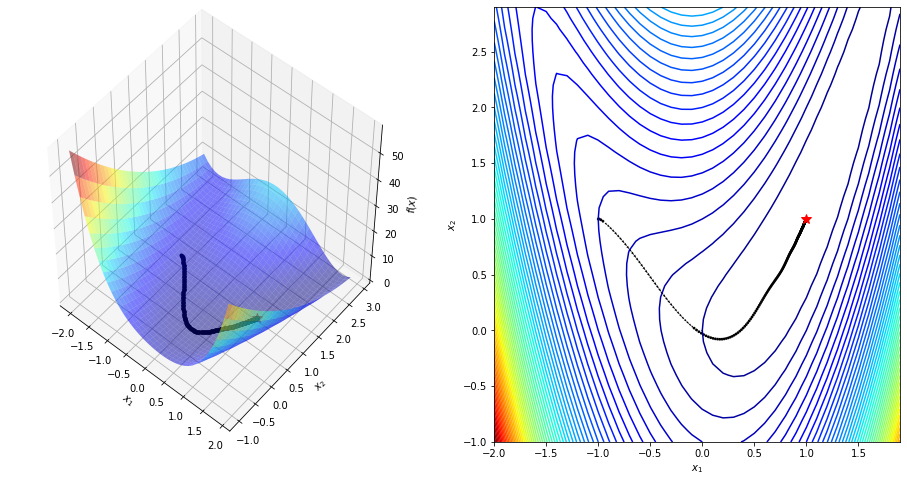

(array([0.99999957, 0.99999906]), 1.9958672824814948e-13, 'optimal')

In [18]:
Adam(f=rosen, x=[-1, 1], step_size=0.01, momentum_type='nesterov', momentum=0.6, verbose=50, plot=True).minimize()

## AdaMax

iter		f(x)		||g(x)||	f(x) - f*	rate
   0	3.0000e+00	1.3153e+01	3.1906e+01
  50	-3.8810e+00	1.1895e+01	2.5025e+01	7.8434e-01
 100	-9.5360e+00	1.0512e+01	1.9370e+01	7.7403e-01
 150	-1.4114e+01	9.1903e+00	1.4792e+01	7.6366e-01
 200	-1.7769e+01	7.9744e+00	1.1137e+01	7.5288e-01
 250	-2.0646e+01	6.8676e+00	8.2598e+00	7.4167e-01
 300	-2.2876e+01	5.8678e+00	6.0300e+00	7.3004e-01
 350	-2.4577e+01	4.9720e+00	4.3293e+00	7.1797e-01
 400	-2.5852e+01	4.1760e+00	3.0541e+00	7.0545e-01
 450	-2.6791e+01	3.4750e+00	2.1149e+00	6.9247e-01
 500	-2.7470e+01	2.8636e+00	1.4361e+00	6.7904e-01
 550	-2.7951e+01	2.3354e+00	9.5520e-01	6.6514e-01
 600	-2.8285e+01	1.8840e+00	6.2162e-01	6.5078e-01
 650	-2.8511e+01	1.5024e+00	3.9532e-01	6.3594e-01
 700	-2.8661e+01	1.1836e+00	2.4535e-01	6.2064e-01
 750	-2.8758e+01	9.2053e-01	1.4840e-01	6.0487e-01
 800	-2.8819e+01	7.0625e-01	8.7354e-02	5.8863e-01
 850	-2.8856e+01	5.3411e-01	4.9960e-02	5.7193e-01
 900	-2.8879e+01	3.9782e-01	2.7717e-02	5.5479e-01
 950	-2.8891e+01	2.9158e-0

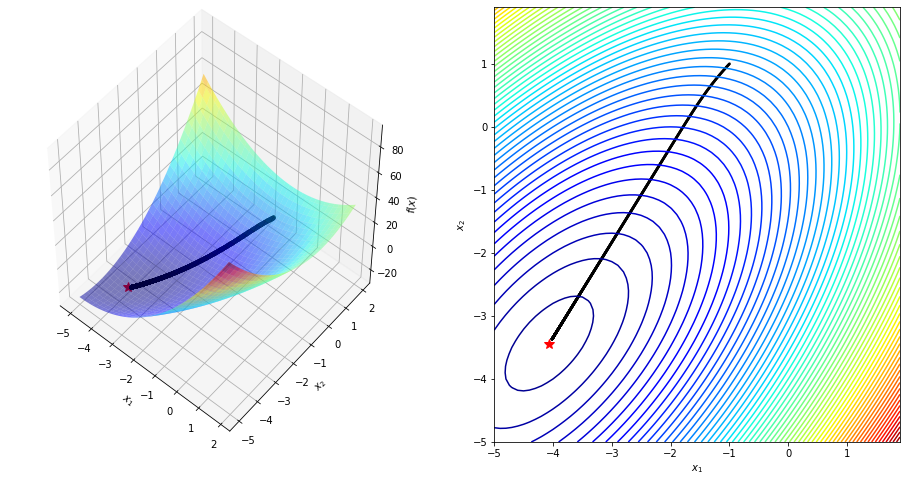

(array([-4.01666291, -3.36819404]), -28.898519463657273, 'stopped')

In [19]:
AdaMax(f=quad, x=[-1, 1], step_size=0.01, verbose=50, plot=True).minimize()

iter		f(x)		||g(x)||	f(x) - f*	rate
   0	3.0000e+00	1.3153e+01	3.1906e+01
  50	-1.1520e+01	9.9905e+00	1.7386e+01	5.4491e-01
 100	-2.0031e+01	7.1168e+00	8.8752e+00	5.1048e-01
 150	-2.4545e+01	4.9905e+00	4.3617e+00	4.9145e-01
 200	-2.6847e+01	3.4294e+00	2.0597e+00	4.7222e-01
 250	-2.7974e+01	2.3072e+00	9.3228e-01	4.5263e-01
 300	-2.8503e+01	1.5177e+00	4.0339e-01	4.3269e-01
 350	-2.8740e+01	9.7468e-01	1.6638e-01	4.1244e-01
 400	-2.8841e+01	6.1019e-01	6.5206e-02	3.9192e-01
 450	-2.8882e+01	3.7175e-01	2.4203e-02	3.7118e-01
 500	-2.8898e+01	2.2001e-01	8.4770e-03	3.5025e-01
 550	-2.8903e+01	1.2623e-01	2.7906e-03	3.2919e-01
 600	-2.8905e+01	7.0062e-02	8.5968e-04	3.0807e-01
 650	-2.8906e+01	3.7530e-02	2.4667e-04	2.8694e-01
 700	-2.8906e+01	1.9352e-02	6.5584e-05	2.6587e-01
 750	-2.8906e+01	9.5774e-03	1.6064e-05	2.4495e-01
 800	-2.8906e+01	4.5353e-03	3.6022e-06	2.2424e-01
 850	-2.8906e+01	2.0475e-03	7.3423e-07	2.0383e-01
 900	-2.8906e+01	8.7784e-04	1.3496e-07	1.8381e-01
 950	-2.8906e+01	3.5580e-0

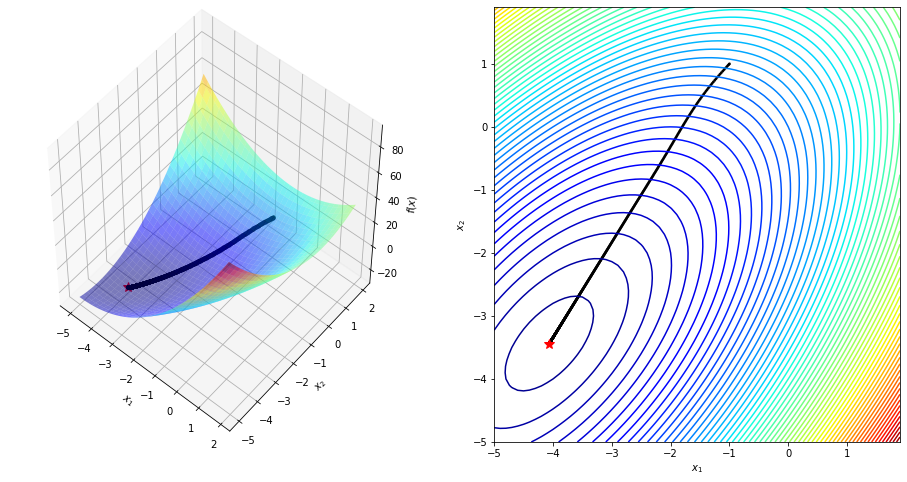

(array([-4.06247041, -3.43745526]), -28.906249996778417, 'stopped')

In [20]:
AdaMax(f=quad, x=[-1, 1], step_size=0.01, momentum_type='standard', momentum=0.6, verbose=50, plot=True).minimize()

iter		f(x)		||g(x)||	f(x) - f*	rate
   0	3.0000e+00	1.3153e+01	3.1906e+01
  50	-1.1484e+01	9.9983e+00	1.7422e+01	5.4604e-01
 100	-1.9987e+01	7.1347e+00	8.9194e+00	5.1196e-01
 150	-2.4509e+01	5.0111e+00	4.3977e+00	4.9305e-01
 200	-2.6822e+01	3.4498e+00	2.0843e+00	4.7395e-01
 250	-2.7959e+01	2.3257e+00	9.4727e-01	4.5448e-01
 300	-2.8494e+01	1.5333e+00	4.1176e-01	4.3468e-01
 350	-2.8736e+01	9.8728e-01	1.7071e-01	4.1458e-01
 400	-2.8839e+01	6.1988e-01	6.7294e-02	3.9421e-01
 450	-2.8881e+01	3.7890e-01	2.5142e-02	3.7362e-01
 500	-2.8897e+01	2.2507e-01	8.8715e-03	3.5285e-01
 550	-2.8903e+01	1.2968e-01	2.9450e-03	3.3196e-01
 600	-2.8905e+01	7.2318e-02	9.1592e-04	3.1101e-01
 650	-2.8906e+01	3.8948e-02	2.6566e-04	2.9005e-01
 700	-2.8906e+01	2.0206e-02	7.1505e-05	2.6916e-01
 750	-2.8906e+01	1.0071e-02	1.7762e-05	2.4840e-01
 800	-2.8906e+01	4.8073e-03	4.0474e-06	2.2787e-01
 850	-2.8906e+01	2.1905e-03	8.4034e-07	2.0762e-01
 900	-2.8906e+01	9.4918e-04	1.5779e-07	1.8776e-01
 950	-2.8906e+01	3.8948e-0

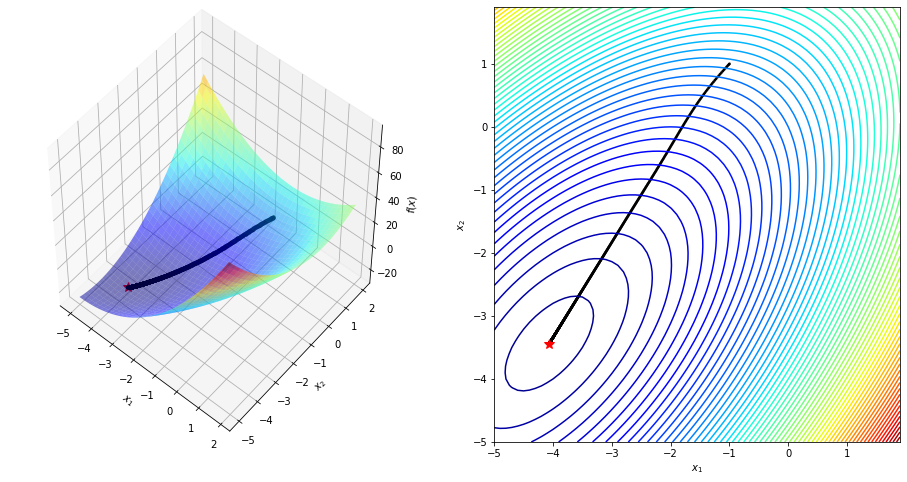

(array([-4.06246714, -3.43745031]), -28.9062499960269, 'stopped')

In [21]:
AdaMax(f=quad, x=[-1, 1], step_size=0.01, momentum_type='nesterov', momentum=0.6, verbose=50, plot=True).minimize()

iter		f(x)		||g(x)||	f(x) - f*	rate
   0	4.0000e+00	4.0000e+00	4.0000e+00
  50	2.7735e+00	2.4207e+00	2.7735e+00	6.9338e-01
 100	1.7766e+00	2.4161e+00	1.7766e+00	6.4058e-01
 150	1.0039e+00	2.0041e+00	1.0039e+00	5.6503e-01
 200	5.4086e-01	1.3884e+00	5.4086e-01	5.3878e-01
 250	2.9956e-01	9.2369e-01	2.9956e-01	5.5385e-01
 300	1.7218e-01	6.3802e-01	1.7218e-01	5.7478e-01
 350	1.0151e-01	4.5610e-01	1.0151e-01	5.8957e-01
 400	6.0661e-02	3.3387e-01	6.0661e-02	5.9757e-01
 450	3.6410e-02	2.4802e-01	3.6410e-02	6.0022e-01
 500	2.1802e-02	1.8575e-01	2.1802e-02	5.9880e-01
 550	1.2955e-02	1.3957e-01	1.2955e-02	5.9422e-01
 600	7.6060e-03	1.0482e-01	7.6060e-03	5.8710e-01
 650	4.3954e-03	7.8439e-02	4.3954e-03	5.7789e-01
 700	2.4919e-03	5.8339e-02	2.4919e-03	5.6692e-01
 750	1.3816e-03	4.3028e-02	1.3816e-03	5.5444e-01
 800	7.4693e-04	3.1406e-02	7.4693e-04	5.4063e-01
 850	3.9264e-04	2.2643e-02	3.9264e-04	5.2567e-01
 900	2.0013e-04	1.6098e-02	2.0013e-04	5.0970e-01
 950	9.8631e-05	1.1266e-02	9.8631e-05	4.9284

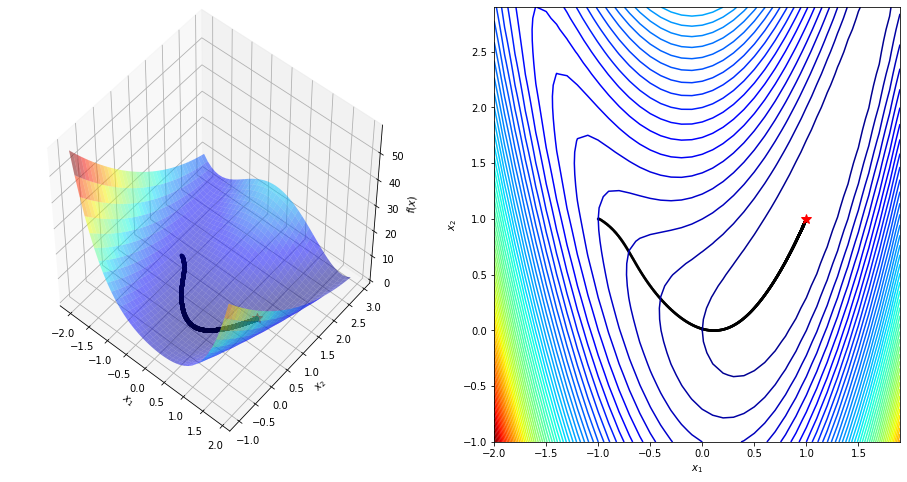

(array([0.99325128, 0.9857344 ]), 4.68694815713089e-05, 'stopped')

In [22]:
AdaMax(f=rosen, x=[-1, 1], step_size=0.01, verbose=50, plot=True).minimize()

iter		f(x)		||g(x)||	f(x) - f*	rate
   0	4.0000e+00	4.0000e+00	4.0000e+00
  50	1.5775e+00	2.3606e+00	1.5775e+00	3.9438e-01
 100	3.8310e-01	9.8512e-01	3.8310e-01	2.4285e-01
 150	1.1503e-01	4.4917e-01	1.1503e-01	3.0025e-01
 200	4.2856e-02	2.4725e-01	4.2856e-02	3.7258e-01
 250	1.7216e-02	1.4751e-01	1.7216e-02	4.0171e-01
 300	7.0592e-03	9.1066e-02	7.0592e-03	4.1005e-01
 350	2.8773e-03	5.6811e-02	2.8773e-03	4.0759e-01
 400	1.1471e-03	3.5334e-02	1.1471e-03	3.9869e-01
 450	4.4237e-04	2.1726e-02	4.4237e-04	3.8563e-01
 500	1.6357e-04	1.3128e-02	1.6357e-04	3.6977e-01
 550	5.7579e-05	7.7584e-03	5.7579e-05	3.5201e-01
 600	1.9172e-05	4.4660e-03	1.9172e-05	3.3297e-01
 650	6.0023e-06	2.4952e-03	6.0023e-06	3.1308e-01
 700	1.7567e-06	1.3488e-03	1.7567e-06	2.9268e-01
 750	4.7785e-07	7.0311e-04	4.7785e-07	2.7201e-01
 800	1.2007e-07	3.5235e-04	1.2007e-07	2.5127e-01
 850	2.7689e-08	1.6918e-04	2.7689e-08	2.3061e-01
 900	5.8193e-09	7.7555e-05	5.8193e-09	2.1016e-01
 950	1.1059e-09	3.3809e-05	1.1059e-09	1.9005

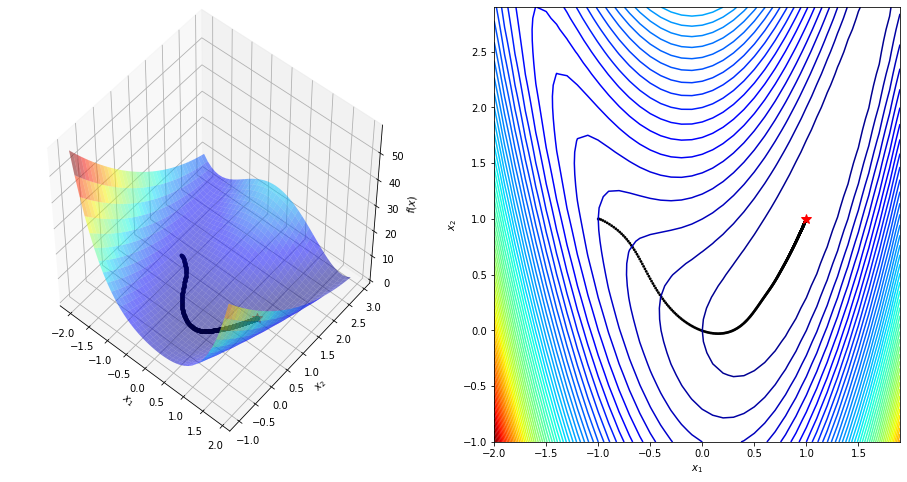

(array([0.99998654, 0.99997118]), 1.8841088161817498e-10, 'stopped')

In [23]:
AdaMax(f=rosen, x=[-1, 1], step_size=0.01, momentum_type='standard', momentum=0.6, verbose=50, plot=True).minimize()

iter		f(x)		||g(x)||	f(x) - f*	rate
   0	4.0000e+00	4.0000e+00	4.0000e+00
  50	1.5553e+00	2.3571e+00	1.5553e+00	3.8884e-01
 100	3.7658e-01	9.9083e-01	3.7658e-01	2.4212e-01
 150	1.1227e-01	4.4938e-01	1.1227e-01	2.9813e-01
 200	4.1042e-02	2.4551e-01	4.1042e-02	3.6557e-01
 250	1.6118e-02	1.4509e-01	1.6118e-02	3.9271e-01
 300	6.4456e-03	8.8522e-02	6.4456e-03	3.9991e-01
 350	2.5564e-03	5.4494e-02	2.5564e-03	3.9661e-01
 400	9.8948e-04	3.3410e-02	9.8948e-04	3.8706e-01
 450	3.6956e-04	2.0229e-02	3.6956e-04	3.7349e-01
 500	1.3203e-04	1.2020e-02	1.3203e-04	3.5727e-01
 550	4.4794e-05	6.9760e-03	4.4794e-05	3.3926e-01
 600	1.4338e-05	3.9382e-03	1.4338e-05	3.2010e-01
 650	4.3043e-06	2.1550e-03	4.3043e-06	3.0020e-01
 700	1.2047e-06	1.1392e-03	1.2047e-06	2.7989e-01
 750	3.1250e-07	5.7999e-04	3.1250e-07	2.5940e-01
 800	7.4666e-08	2.8344e-04	7.4666e-08	2.3893e-01
 850	1.6323e-08	1.3251e-04	1.6323e-08	2.1861e-01
 900	3.2414e-09	5.9048e-05	3.2414e-09	1.9858e-01
 950	5.8005e-10	2.4978e-05	5.8005e-10	1.7895

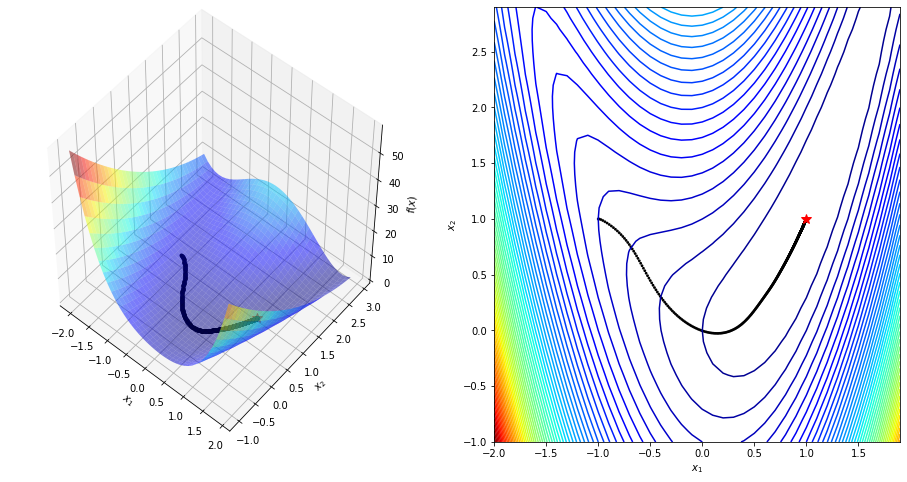

(array([0.99999055, 0.9999798 ]), 9.269862937143508e-11, 'stopped')

In [24]:
AdaMax(f=rosen, x=[-1, 1], step_size=0.01, momentum_type='nesterov', momentum=0.6, verbose=50, plot=True).minimize()

## AMSGrad

iter	f(x)		||g(x)||	f(x) - f*	rate
   0	3.0000e+00	1.3153e+01	3.1906e+01
  50	-2.3078e+01	5.9169e+00	5.8278e+00	1.8265e-01
 100	-2.7779e+01	2.6097e+00	1.1269e+00	1.9336e-01
 150	-2.8680e+01	1.1686e+00	2.2636e-01	2.0087e-01
 200	-2.8861e+01	5.2396e-01	4.5501e-02	2.0101e-01
 250	-2.8897e+01	2.3492e-01	9.1464e-03	2.0102e-01
 300	-2.8904e+01	1.0533e-01	1.8386e-03	2.0102e-01
 350	-2.8906e+01	4.7223e-02	3.6958e-04	2.0102e-01
 400	-2.8906e+01	2.1172e-02	7.4293e-05	2.0102e-01
 450	-2.8906e+01	9.4926e-03	1.4934e-05	2.0102e-01
 500	-2.8906e+01	4.2560e-03	3.0020e-06	2.0102e-01
 550	-2.8906e+01	1.9082e-03	6.0345e-07	2.0102e-01
 600	-2.8906e+01	8.5552e-04	1.2130e-07	2.0102e-01
 650	-2.8906e+01	3.8357e-04	2.4384e-08	2.0102e-01
 700	-2.8906e+01	1.7197e-04	4.9016e-09	2.0102e-01
 750	-2.8906e+01	7.7104e-05	9.8529e-10	2.0102e-01
 800	-2.8906e+01	3.4570e-05	1.9806e-10	2.0102e-01
 850	-2.8906e+01	1.5499e-05	3.9812e-11	2.0100e-01
 900	-2.8906e+01	6.9491e-06	7.9972e-12	2.0087e-01
 950	-2.8906e+01	3.1156e-06

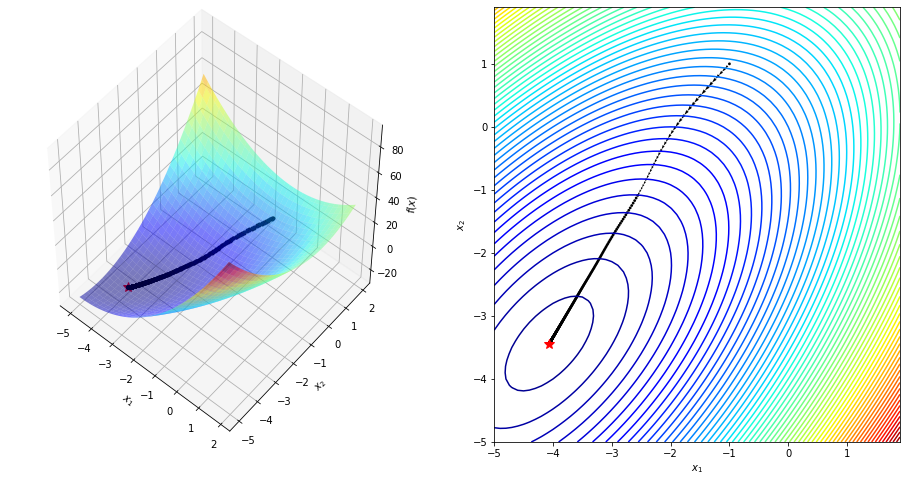

(array([-4.06249972, -3.43749955]), -28.90624999999968, 'stopped')

In [25]:
AMSGrad(f=quad, x=[-1, 1], step_size=0.01, verbose=50, plot=True).minimize()

iter	f(x)		||g(x)||	f(x) - f*	rate
   0	3.0000e+00	1.3153e+01	3.1906e+01
  50	-2.8791e+01	1.1955e+00	1.1554e-01	3.6214e-03
 100	-2.8889e+01	4.8695e-01	1.7040e-02	1.4748e-01
 150	-2.8896e+01	3.7132e-01	9.8304e-03	5.7690e-01
 200	-2.8901e+01	2.6186e-01	4.8202e-03	4.9034e-01
 250	-2.8904e+01	1.6591e-01	1.9415e-03	4.0279e-01
 300	-2.8906e+01	9.4592e-02	6.3069e-04	3.2485e-01
 350	-2.8906e+01	4.6526e-02	1.5260e-04	2.4195e-01
 400	-2.8906e+01	1.7232e-02	2.0933e-05	1.3718e-01
 450	-2.8906e+01	1.3666e-03	1.3166e-07	6.2896e-03
 500	-2.8906e+01	5.8013e-03	2.3724e-06	1.8020e+01
 550	-2.8906e+01	7.8917e-03	4.3903e-06	1.8505e+00
 600	-2.8906e+01	7.3926e-03	3.8525e-06	8.7750e-01
 650	-2.8906e+01	5.8526e-03	2.4146e-06	6.2677e-01
 700	-2.8906e+01	4.1339e-03	1.2047e-06	4.9890e-01
 750	-2.8906e+01	2.6445e-03	4.9300e-07	4.0924e-01
 800	-2.8906e+01	1.5216e-03	1.6322e-07	3.3107e-01
 850	-2.8906e+01	7.5948e-04	4.0661e-08	2.4912e-01


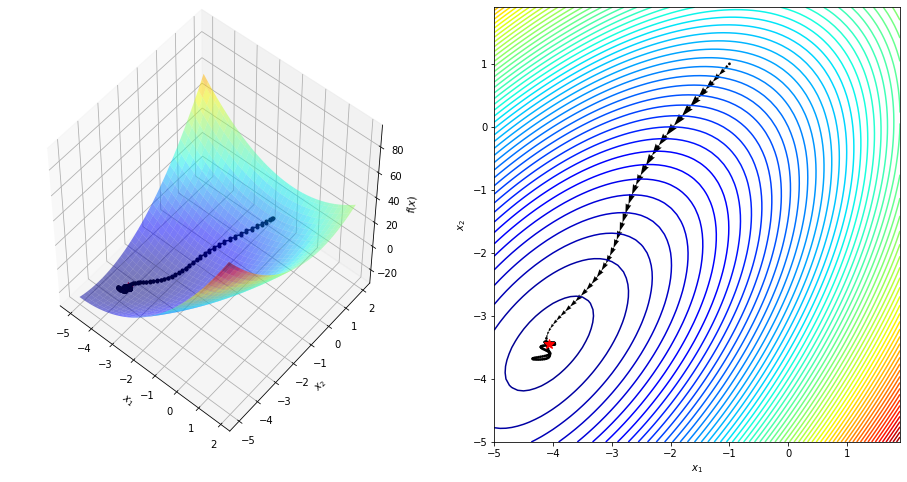

(array([-4.06250015, -3.43749999]), -28.906249999999936, 'optimal')

In [26]:
AMSGrad(f=quad, x=[-1, 1], step_size=0.01, momentum_type='standard', momentum=0.6, verbose=50, plot=True).minimize()

iter	f(x)		||g(x)||	f(x) - f*	rate
   0	3.0000e+00	1.3153e+01	3.1906e+01
  50	-2.8846e+01	6.4433e-01	6.0394e-02	1.8929e-03
 100	-2.8905e+01	1.3453e-01	1.2563e-03	2.0802e-02
 150	-2.8906e+01	6.3037e-03	5.8731e-06	4.6748e-03
 200	-2.8906e+01	1.9681e-02	2.6836e-05	4.5693e+00
 250	-2.8906e+01	4.1536e-03	1.2108e-06	4.5118e-02
 300	-2.8906e+01	2.3555e-03	3.9579e-07	3.2689e-01
 350	-2.8906e+01	1.0030e-03	7.1632e-08	1.8099e-01
 400	-2.8906e+01	2.0879e-04	3.1024e-09	4.3311e-02
 450	-2.8906e+01	1.8745e-04	2.5008e-09	8.0607e-01
 500	-2.8906e+01	3.1802e-06	7.1410e-13	2.8555e-04


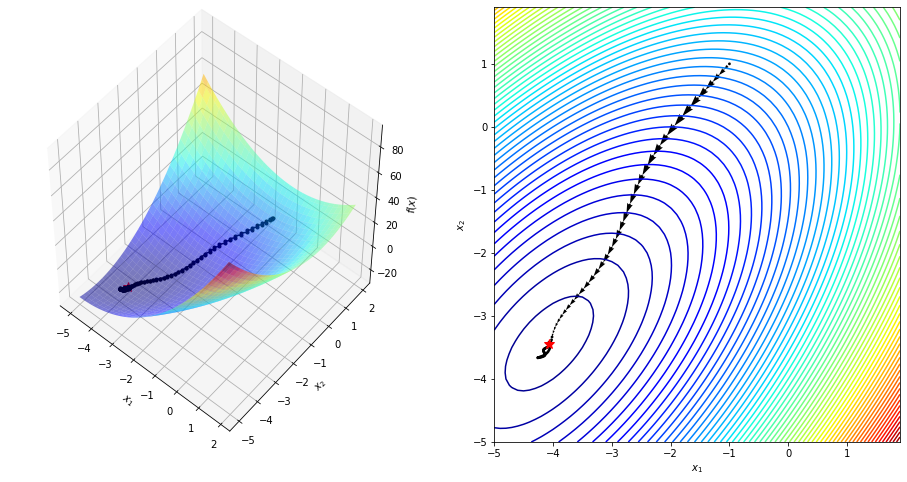

(array([-4.06250014, -3.43749999]), -28.90624999999995, 'optimal')

In [27]:
AMSGrad(f=quad, x=[-1, 1], step_size=0.01, momentum_type='nesterov', momentum=0.6, verbose=50, plot=True).minimize()

iter	f(x)		||g(x)||	f(x) - f*	rate
   0	4.0000e+00	4.0000e+00	4.0000e+00
  50	5.0944e-02	4.4828e-01	5.0944e-02	1.2736e-02
 100	1.6426e-03	4.6680e-02	1.6426e-03	3.2244e-02
 150	1.3888e-04	1.0328e-02	1.3888e-04	8.4545e-02
 200	1.3707e-05	3.2725e-03	1.3707e-05	9.8701e-02
 250	1.3958e-06	1.0608e-03	1.3958e-06	1.0183e-01
 300	1.4339e-07	3.4103e-04	1.4339e-07	1.0273e-01
 350	1.4770e-08	1.0940e-04	1.4770e-08	1.0300e-01
 400	1.5226e-09	3.5117e-05	1.5226e-09	1.0309e-01
 450	1.5701e-10	1.1276e-05	1.5701e-10	1.0312e-01
 500	1.6192e-11	3.6211e-06	1.6192e-11	1.0313e-01
 550	1.6698e-12	1.1629e-06	1.6698e-12	1.0313e-01


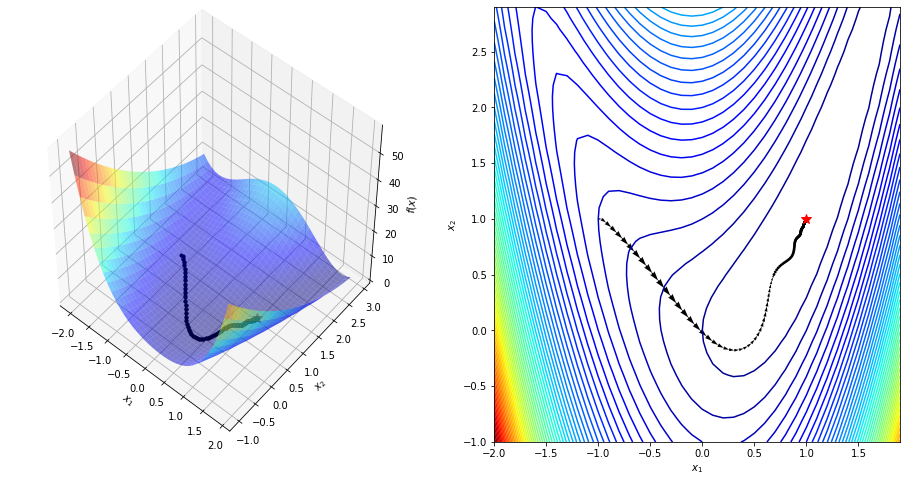

(array([0.99999893, 0.99999767]), 1.2149307021731143e-12, 'optimal')

In [28]:
AMSGrad(f=rosen, x=[-1, 1], step_size=0.01, verbose=50, plot=True).minimize()

iter	f(x)		||g(x)||	f(x) - f*	rate
   0	4.0000e+00	4.0000e+00	4.0000e+00
  50	1.6448e-02	1.8621e-01	1.6448e-02	4.1120e-03
 100	1.1107e-02	6.3842e-01	1.1107e-02	6.7530e-01
 150	1.0218e-03	2.0016e-01	1.0218e-03	9.1993e-02
 200	2.1038e-05	2.6485e-02	2.1038e-05	2.0589e-02
 250	2.0308e-06	8.7007e-03	2.0308e-06	9.6530e-02
 300	1.2216e-06	7.1888e-03	1.2216e-06	6.0153e-01
 350	1.7728e-07	2.7655e-03	1.7728e-07	1.4512e-01
 400	9.0542e-09	6.2221e-04	9.0542e-09	5.1073e-02
 450	9.0881e-12	1.6038e-05	9.0881e-12	1.0037e-03
 500	8.6400e-11	6.1124e-05	8.6400e-11	9.5069e+00


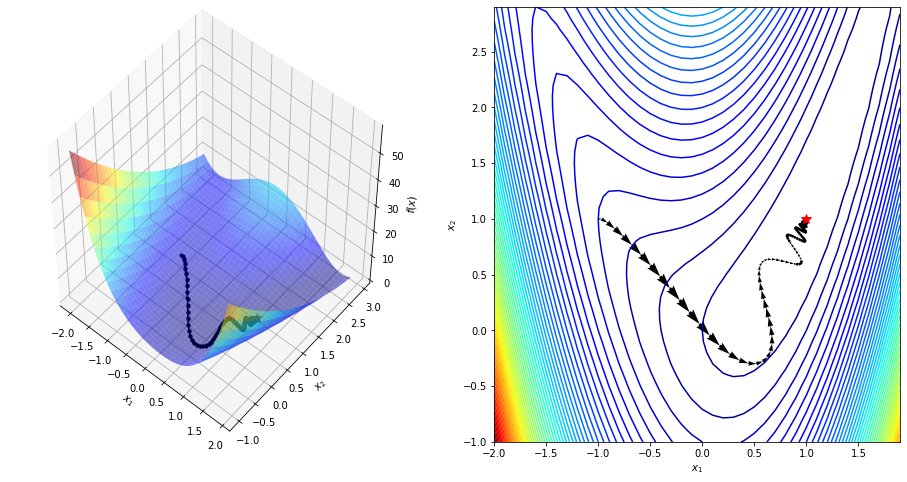

(array([0.99999976, 0.99999953]), 5.5739234808280695e-14, 'optimal')

In [31]:
AMSGrad(f=rosen, x=[-1, 1], step_size=0.01, momentum_type='standard', momentum=0.4, verbose=50, plot=True).minimize()

iter	f(x)		||g(x)||	f(x) - f*	rate
   0	4.0000e+00	4.0000e+00	4.0000e+00
  50	2.6500e-02	8.4090e-01	2.6500e-02	6.6251e-03
 100	9.4460e-04	1.9346e-01	9.4460e-04	3.5645e-02
 150	1.1220e-05	2.0864e-02	1.1220e-05	1.1878e-02
 200	5.3252e-08	1.0905e-03	5.3252e-08	4.7462e-03
 250	1.0237e-08	6.4321e-04	1.0237e-08	1.9224e-01
 300	1.6214e-10	8.1331e-05	1.6214e-10	1.5839e-02
 350	2.9894e-13	1.8577e-06	2.9894e-13	1.8437e-03


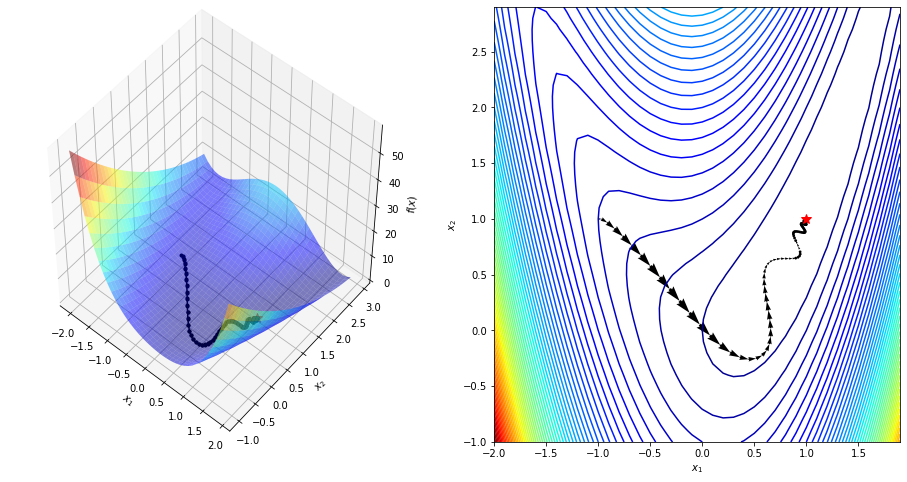

(array([0.99999966, 0.99999929]), 1.1500359560119236e-13, 'optimal')

In [33]:
AMSGrad(f=rosen, x=[-1, 1], step_size=0.01, momentum_type='nesterov', momentum=0.4, verbose=50, plot=True).minimize()

## AdaDelta

iter	f(x)		||g(x)||	f(x) - f*	rate
   0	3.0000e+00	1.3153e+01	3.1906e+01
  50	-1.4605e+01	9.1173e+00	1.4301e+01	4.4822e-01
 100	-2.2336e+01	6.2354e+00	6.5701e+00	4.5941e-01
 150	-2.6197e+01	4.0441e+00	2.7092e+00	4.1236e-01
 200	-2.8071e+01	2.2651e+00	8.3571e-01	3.0847e-01
 250	-2.8776e+01	8.9904e-01	1.3020e-01	1.5579e-01
 300	-2.8903e+01	1.3353e-01	2.8649e-03	2.2005e-02
 350	-2.8906e+01	7.0914e-02	3.4952e-04	1.2200e-01
 400	-2.8905e+01	1.1039e-01	7.8995e-04	2.2601e+00
 450	-2.8905e+01	1.1466e-01	8.2908e-04	1.0495e+00
 500	-2.8905e+01	1.1297e-01	7.9963e-04	9.6448e-01
 550	-2.8905e+01	1.1242e-01	7.9036e-04	9.8841e-01
 600	-2.8905e+01	1.1226e-01	7.8779e-04	9.9675e-01
 650	-2.8905e+01	1.1222e-01	7.8710e-04	9.9912e-01
 700	-2.8905e+01	1.1221e-01	7.8691e-04	9.9976e-01
 750	-2.8905e+01	1.1220e-01	7.8686e-04	9.9994e-01
 800	-2.8905e+01	1.1220e-01	7.8685e-04	9.9998e-01
 850	-2.8905e+01	1.1220e-01	7.8684e-04	1.0000e+00
 900	-2.8905e+01	1.1220e-01	7.8684e-04	1.0000e+00
 950	-2.8905e+01	1.1220e-01

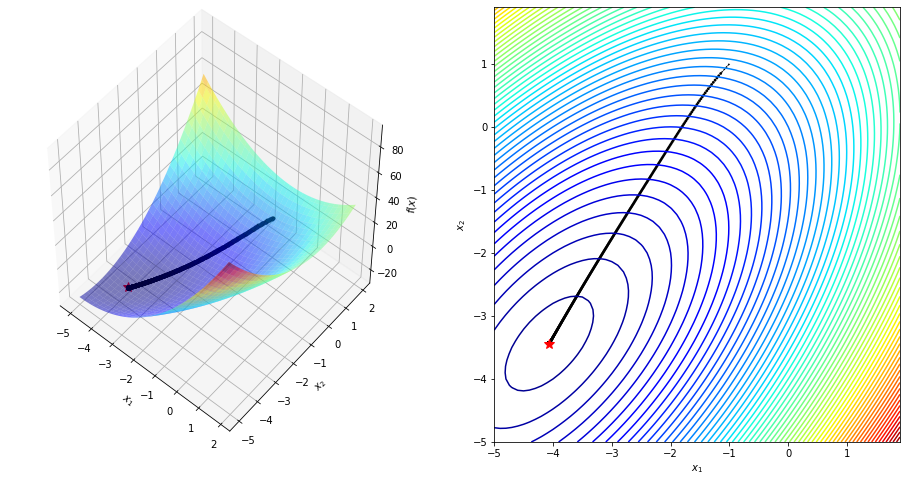

(array([-4.07241901, -3.42758416]), -28.90546315786907, 'stopped')

In [37]:
AdaDelta(f=quad, x=[-1, 1], step_size=0.9, verbose=50, plot=True).minimize()

iter	f(x)		||g(x)||	f(x) - f*	rate
   0	3.0000e+00	1.3153e+01	3.1906e+01
  50	-2.8906e+01	3.6017e-04	2.2772e-08	7.1371e-10


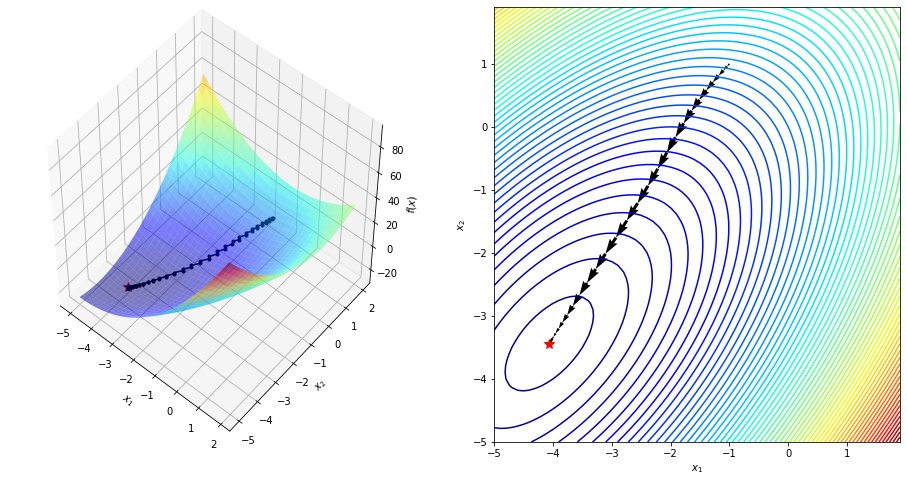

(array([-4.06250016, -3.43750024]), -28.9062499999999, 'optimal')

In [39]:
AdaDelta(f=quad, x=[-1, 1], step_size=0.9, momentum_type='standard', momentum=0.6, verbose=50, plot=True).minimize()

iter	f(x)		||g(x)||	f(x) - f*	rate
   0	3.0000e+00	1.3153e+01	3.1906e+01
  50	-2.8906e+01	3.3219e-04	1.9599e-08	6.1427e-10


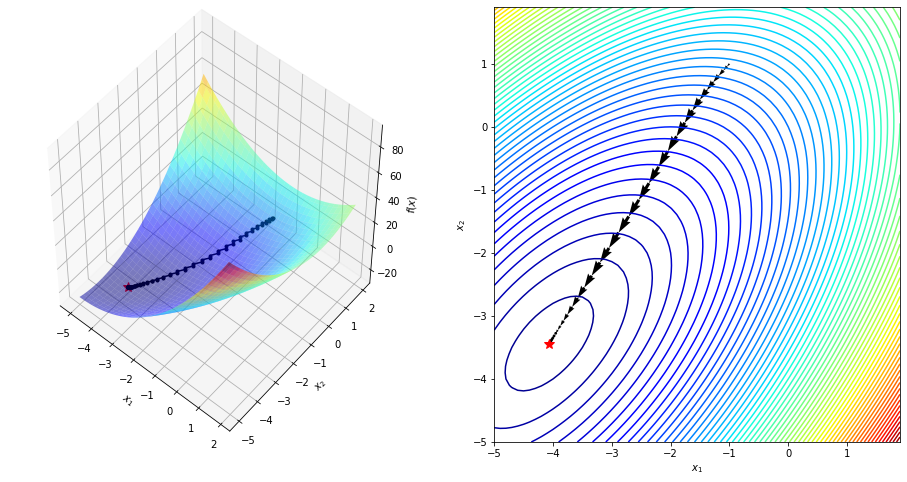

(array([-4.06250012, -3.43750018]), -28.906249999999943, 'optimal')

In [42]:
AdaDelta(f=quad, x=[-1, 1], step_size=0.9, momentum_type='nesterov', momentum=0.6, verbose=50, plot=True).minimize()

iter	f(x)		||g(x)||	f(x) - f*	rate
   0	4.0000e+00	4.0000e+00	4.0000e+00
  50	6.2241e-01	1.5515e+00	6.2241e-01	1.5560e-01
 100	7.7351e-02	4.5649e-01	7.7351e-02	1.2428e-01
 150	3.3533e-03	7.9639e-02	3.3533e-03	4.3352e-02
 200	1.6791e-06	1.5405e-03	1.6791e-06	5.0072e-04
 250	1.9501e-03	2.9134e-01	1.9501e-03	1.1614e+03
 300	1.9893e-03	2.9434e-01	1.9893e-03	1.0201e+00
 350	1.9701e-03	2.9300e-01	1.9701e-03	9.9039e-01
 400	1.9664e-03	2.9277e-01	1.9664e-03	9.9810e-01
 450	1.9657e-03	2.9275e-01	1.9657e-03	9.9965e-01
 500	1.9656e-03	2.9276e-01	1.9656e-03	9.9992e-01
 550	1.9655e-03	2.9277e-01	1.9655e-03	9.9998e-01
 600	1.9655e-03	2.9278e-01	1.9655e-03	1.0000e+00
 650	1.9655e-03	2.9278e-01	1.9655e-03	1.0000e+00
 700	1.9655e-03	2.9278e-01	1.9655e-03	1.0000e+00
 750	1.9655e-03	2.9279e-01	1.9655e-03	1.0000e+00
 800	1.9655e-03	2.9279e-01	1.9655e-03	1.0000e+00
 850	1.9655e-03	2.9279e-01	1.9655e-03	1.0000e+00
 900	1.9655e-03	2.9279e-01	1.9655e-03	1.0000e+00
 950	1.9655e-03	2.9279e-01	1.9655e-03	1.0000e

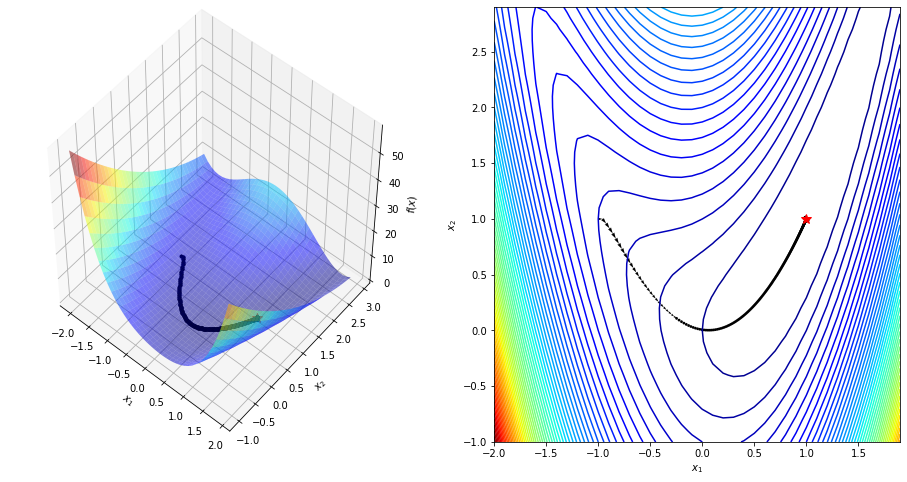

(array([1.00902241, 0.98743317]), 0.001965530999302044, 'stopped')

In [43]:
AdaDelta(f=rosen, x=[-1, 1], step_size=0.9, verbose=50, plot=True).minimize()

iter	f(x)		||g(x)||	f(x) - f*	rate
   0	4.0000e+00	4.0000e+00	4.0000e+00
  50	9.6844e-11	1.7584e-05	9.6844e-11	2.4211e-11


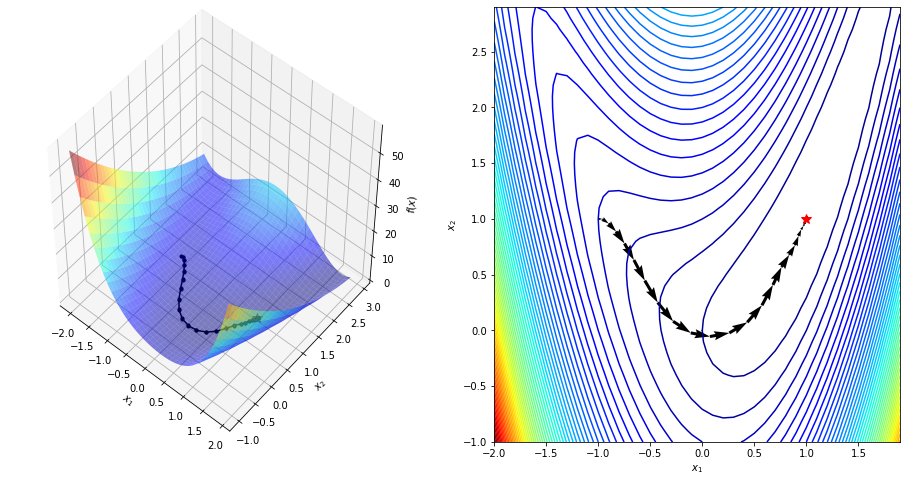

(array([0.99999946, 0.99999881]), 3.170457290774686e-13, 'optimal')

In [45]:
AdaDelta(f=rosen, x=[-1, 1], step_size=0.9, momentum_type='standard', momentum=0.6, verbose=50, plot=True).minimize()

iter	f(x)		||g(x)||	f(x) - f*	rate
   0	4.0000e+00	4.0000e+00	4.0000e+00
  50	6.7120e-05	9.3634e-03	6.7120e-05	1.6780e-05
 100	5.5522e-06	1.5329e-02	5.5522e-06	8.2720e-02
 150	1.6591e-04	8.4492e-02	1.6591e-04	2.9881e+01
 200	2.3333e-04	1.0016e-01	2.3333e-04	1.4064e+00
 250	2.7323e-04	1.0835e-01	2.7323e-04	1.1710e+00
 300	2.7416e-04	1.0854e-01	2.7416e-04	1.0034e+00
 350	2.7200e-04	1.0811e-01	2.7200e-04	9.9210e-01
 400	2.7183e-04	1.0807e-01	2.7183e-04	9.9937e-01
 450	2.7193e-04	1.0810e-01	2.7193e-04	1.0004e+00
 500	2.7195e-04	1.0810e-01	2.7195e-04	1.0001e+00
 550	2.7194e-04	1.0810e-01	2.7194e-04	9.9998e-01
 600	2.7194e-04	1.0810e-01	2.7194e-04	1.0000e+00
 650	2.7194e-04	1.0810e-01	2.7194e-04	1.0000e+00
 700	2.7194e-04	1.0810e-01	2.7194e-04	1.0000e+00
 750	2.7194e-04	1.0810e-01	2.7194e-04	1.0000e+00
 800	2.7194e-04	1.0810e-01	2.7194e-04	1.0000e+00
 850	2.7194e-04	1.0810e-01	2.7194e-04	1.0000e+00
 900	2.7194e-04	1.0810e-01	2.7194e-04	1.0000e+00
 950	2.7194e-04	1.0810e-01	2.7194e-04	1.0000e

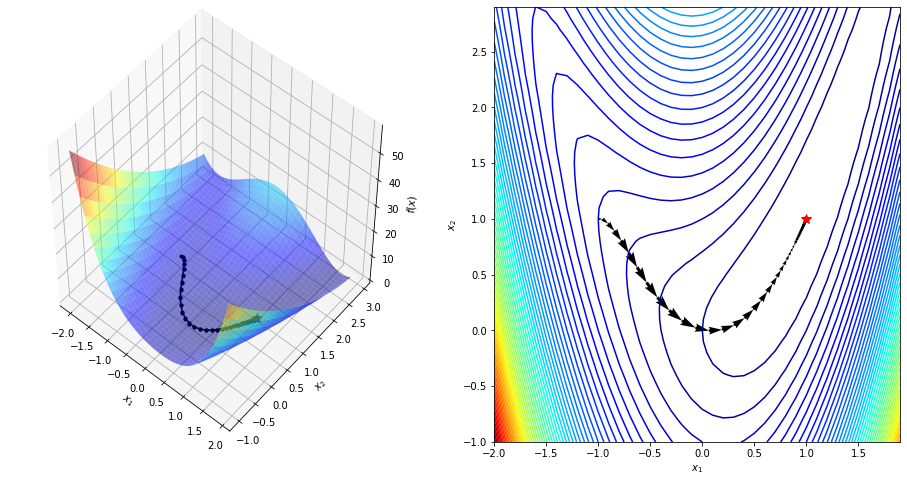

(array([0.99558755, 1.00243002]), 0.0002719407439656862, 'stopped')

In [48]:
AdaDelta(f=rosen, x=[-1, 1], step_size=0.9, momentum_type='nesterov', momentum=0.5, verbose=50, plot=True).minimize()

## RProp

iter	f(x)		||g(x)||	f(x) - f*	rate
   0	3.0000e+00	1.3153e+01	3.1906e+01
  50	2.3217e+00	1.3049e+01	3.1228e+01	9.7874e-01
 100	-2.8906e+01	5.6862e-03	6.3989e-06	2.0491e-07
 150	-2.8906e+01	5.1125e-06	1.7053e-12	2.6650e-07
 200	-2.8906e+01	5.1125e-06	1.7053e-12	1.0000e+00
 250	-2.8906e+01	5.1125e-06	1.7053e-12	1.0000e+00
 300	-2.8906e+01	5.1125e-06	1.7053e-12	1.0000e+00
 350	-2.8906e+01	5.1125e-06	1.7053e-12	1.0000e+00
 400	-2.8906e+01	5.1125e-06	1.7053e-12	1.0000e+00
 450	-2.8906e+01	5.1125e-06	1.7053e-12	1.0000e+00
 500	-2.8906e+01	5.1125e-06	1.7053e-12	1.0000e+00
 550	-2.8906e+01	5.1125e-06	1.7053e-12	1.0000e+00
 600	-2.8906e+01	5.1125e-06	1.7053e-12	1.0000e+00
 650	-2.8906e+01	5.1125e-06	1.7053e-12	1.0000e+00
 700	-2.8906e+01	5.1125e-06	1.7053e-12	1.0000e+00
 750	-2.8906e+01	5.1125e-06	1.7053e-12	1.0000e+00
 800	-2.8906e+01	5.1125e-06	1.7053e-12	1.0000e+00
 850	-2.8906e+01	5.1125e-06	1.7053e-12	1.0000e+00
 900	-2.8906e+01	5.1125e-06	1.7053e-12	1.0000e+00
 950	-2.8906e+01	5.1125e-06	

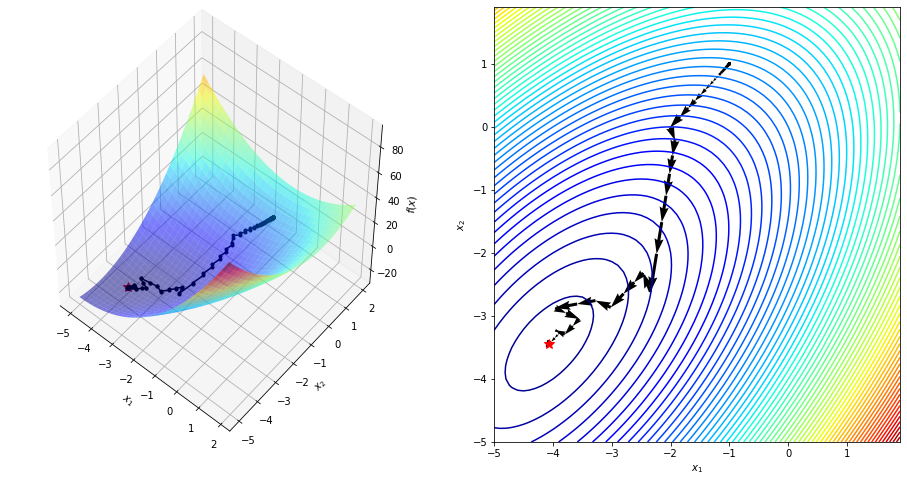

(array([-4.06250023, -3.43749933]), -28.90624999999829, 'stopped')

In [56]:
RProp(f=quad, x=[-1, 1], verbose=50, plot=True).minimize()

iter	f(x)		||g(x)||	f(x) - f*	rate
   0	3.0000e+00	1.3153e+01	3.1906e+01
  50	1.9856e+00	1.2998e+01	3.0892e+01	9.6821e-01
 100	-2.8906e+01	2.4707e-02	1.3801e-04	4.4674e-06
 150	-2.8906e+01	3.4197e-06	2.6183e-12	1.8973e-08
 200	-2.8906e+01	6.2038e-06	2.5686e-12	9.8100e-01
 250	-2.8906e+01	4.9397e-06	1.8687e-12	7.2752e-01
 300	-2.8906e+01	3.4797e-06	2.8955e-12	1.5494e+00
 350	-2.8906e+01	6.2038e-06	2.5686e-12	8.8712e-01
 400	-2.8906e+01	4.9397e-06	1.8652e-12	7.2614e-01
 450	-2.8906e+01	3.4797e-06	2.8955e-12	1.5524e+00
 500	-2.8906e+01	6.2038e-06	2.5651e-12	8.8589e-01
 550	-2.8906e+01	4.9397e-06	1.8687e-12	7.2853e-01
 600	-2.8906e+01	3.4797e-06	2.8955e-12	1.5494e+00
 650	-2.8906e+01	6.2038e-06	2.5686e-12	8.8712e-01
 700	-2.8906e+01	4.9397e-06	1.8723e-12	7.2891e-01
 750	-2.8906e+01	3.4797e-06	2.9026e-12	1.5503e+00
 800	-2.8906e+01	6.2038e-06	2.5722e-12	8.8617e-01
 850	-2.8906e+01	4.9397e-06	1.8723e-12	7.2790e-01
 900	-2.8906e+01	3.4797e-06	2.8955e-12	1.5465e+00
 950	-2.8906e+01	6.2038e-06	

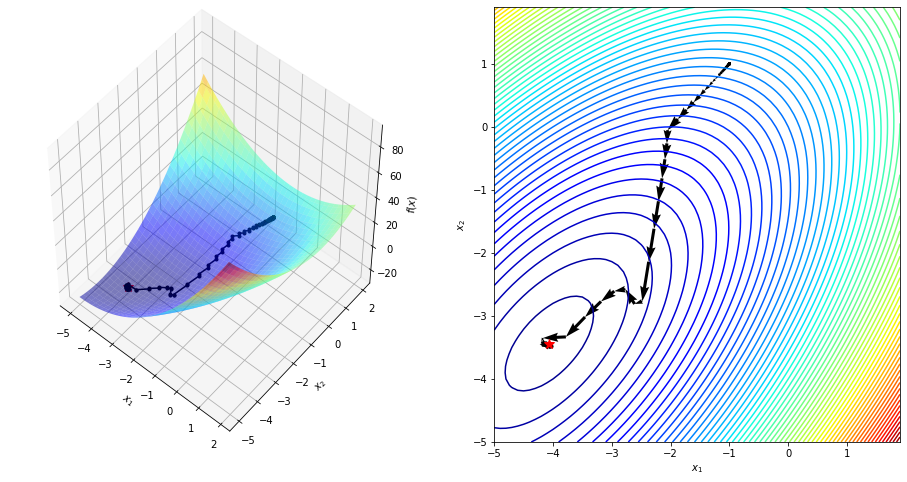

(array([-4.0625009 , -3.43750006]), -28.906249999998124, 'stopped')

In [57]:
RProp(f=quad, x=[-1, 1], momentum_type='standard', momentum=0.4, verbose=50, plot=True).minimize()

iter	f(x)		||g(x)||	f(x) - f*	rate
   0	3.0000e+00	1.3153e+01	3.1906e+01
  50	1.6517e+00	1.2946e+01	3.0558e+01	9.5774e-01
 100	-2.8906e+01	5.5728e-03	3.5891e-06	1.1745e-07
 150	-2.8906e+01	3.6015e-06	1.5739e-12	4.3851e-07
 200	-2.8906e+01	1.4636e-06	2.2737e-13	1.4447e-01
 250	-2.8906e+01	3.2840e-06	1.2115e-12	5.3281e+00
 300	-2.8906e+01	7.8881e-06	5.8158e-12	4.8006e+00
 350	-2.8906e+01	3.6017e-06	1.5810e-12	2.7184e-01
 400	-2.8906e+01	1.4636e-06	2.2737e-13	1.4382e-01
 450	-2.8906e+01	3.2840e-06	1.2115e-12	5.3281e+00
 500	-2.8906e+01	7.8881e-06	5.8158e-12	4.8006e+00
 550	-2.8906e+01	3.6017e-06	1.5810e-12	2.7184e-01
 600	-2.8906e+01	1.4636e-06	2.2737e-13	1.4382e-01
 650	-2.8906e+01	3.2840e-06	1.2115e-12	5.3281e+00
 700	-2.8906e+01	7.8881e-06	5.8158e-12	4.8006e+00
 750	-2.8906e+01	3.6017e-06	1.5810e-12	2.7184e-01
 800	-2.8906e+01	1.4636e-06	2.2737e-13	1.4382e-01
 850	-2.8906e+01	3.2840e-06	1.2115e-12	5.3281e+00
 900	-2.8906e+01	7.8881e-06	5.8158e-12	4.8006e+00
 950	-2.8906e+01	3.6017e-06	

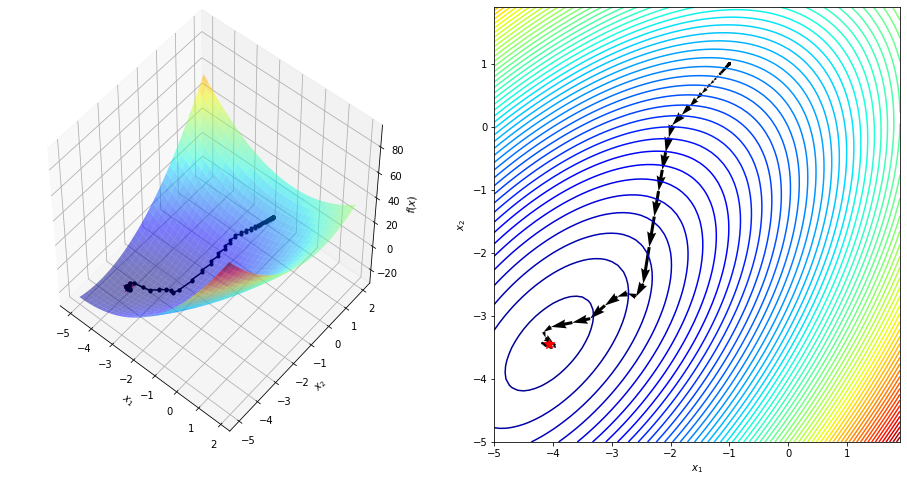

(array([-4.06249986, -3.43749963]), -28.90624999999977, 'stopped')

In [55]:
RProp(f=quad, x=[-1, 1], momentum_type='nesterov', momentum=0.6, verbose=50, plot=True).minimize()

iter	f(x)		||g(x)||	f(x) - f*	rate
   0	4.0000e+00	4.0000e+00	4.0000e+00
  50	3.8253e+00	3.5254e+00	3.8253e+00	9.5632e-01
 100	4.9212e-03	1.4784e-01	4.9212e-03	1.2865e-03
 150	2.7105e-06	1.0832e-02	2.7105e-06	5.5078e-04
 200	1.1877e-11	1.1069e-05	1.1877e-11	4.3818e-06
 250	1.1877e-11	1.1069e-05	1.1877e-11	1.0000e+00
 300	1.1877e-11	1.1069e-05	1.1877e-11	1.0000e+00
 350	1.1877e-11	1.1069e-05	1.1877e-11	1.0000e+00
 400	1.1877e-11	1.1069e-05	1.1877e-11	1.0000e+00
 450	1.1877e-11	1.1069e-05	1.1877e-11	1.0000e+00
 500	1.1877e-11	1.1069e-05	1.1877e-11	1.0000e+00
 550	1.1877e-11	1.1069e-05	1.1877e-11	1.0000e+00
 600	1.1877e-11	1.1069e-05	1.1877e-11	1.0000e+00
 650	1.1877e-11	1.1069e-05	1.1877e-11	1.0000e+00
 700	1.1877e-11	1.1069e-05	1.1877e-11	1.0000e+00
 750	1.1877e-11	1.1069e-05	1.1877e-11	1.0000e+00
 800	1.1877e-11	1.1069e-05	1.1877e-11	1.0000e+00
 850	1.1877e-11	1.1069e-05	1.1877e-11	1.0000e+00
 900	1.1877e-11	1.1069e-05	1.1877e-11	1.0000e+00
 950	1.1877e-11	1.1069e-05	1.1877e-11	1.0000e

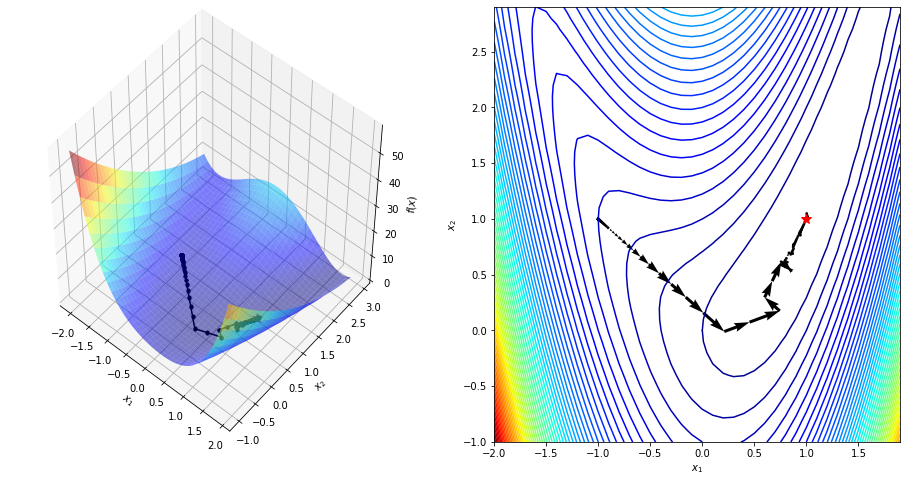

(array([1.00000337, 1.00000622]), 1.1877145778222915e-11, 'stopped')

In [58]:
RProp(f=rosen, x=[-1, 1], verbose=50, plot=True).minimize()

iter	f(x)		||g(x)||	f(x) - f*	rate
   0	4.0000e+00	4.0000e+00	4.0000e+00
  50	3.6635e+00	3.1308e+00	3.6635e+00	9.1587e-01
 100	3.6323e-03	2.4914e-01	3.6323e-03	9.9149e-04
 150	2.9326e-05	5.8950e-03	2.9326e-05	8.0738e-03
 200	4.9068e-07	1.3415e-03	4.9068e-07	1.6732e-02
 250	1.0834e-08	3.9395e-04	1.0834e-08	2.2080e-02
 300	1.0820e-11	2.0665e-05	1.0820e-11	9.9870e-04
 350	2.4994e-12	1.0373e-05	2.4994e-12	2.3100e-01
 400	1.0833e-11	2.1632e-05	1.0833e-11	4.3342e+00
 450	2.4994e-12	1.0373e-05	2.4994e-12	2.3072e-01
 500	1.0833e-11	2.1632e-05	1.0833e-11	4.3342e+00
 550	2.4994e-12	1.0373e-05	2.4994e-12	2.3072e-01
 600	1.0833e-11	2.1632e-05	1.0833e-11	4.3342e+00
 650	2.4994e-12	1.0373e-05	2.4994e-12	2.3072e-01
 700	1.0833e-11	2.1632e-05	1.0833e-11	4.3342e+00
 750	2.4994e-12	1.0373e-05	2.4994e-12	2.3072e-01
 800	1.0833e-11	2.1632e-05	1.0833e-11	4.3342e+00
 850	2.4994e-12	1.0373e-05	2.4994e-12	2.3072e-01
 900	1.0833e-11	2.1632e-05	1.0833e-11	4.3342e+00
 950	2.4994e-12	1.0373e-05	2.4994e-12	2.3072e

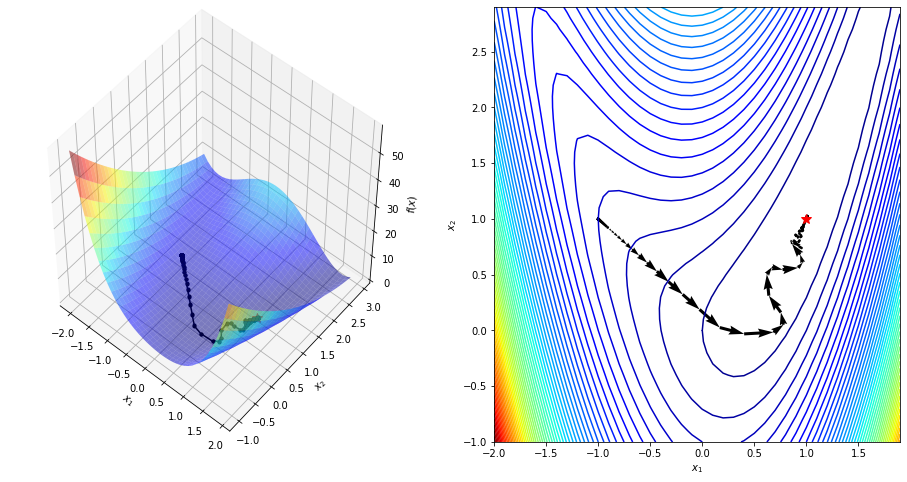

(array([0.99999921, 1.00000068]), 1.0832818746210204e-11, 'stopped')

In [59]:
RProp(f=rosen, x=[-1, 1], momentum_type='standard', momentum=0.6, verbose=50, plot=True).minimize()

iter	f(x)		||g(x)||	f(x) - f*	rate
   0	4.0000e+00	4.0000e+00	4.0000e+00
  50	3.6635e+00	3.1308e+00	3.6635e+00	9.1587e-01
 100	2.9929e-04	3.7759e-02	2.9929e-04	8.1697e-05
 150	1.4754e-09	3.9677e-05	1.4754e-09	4.9295e-06
 200	1.8336e-11	2.6279e-05	1.8336e-11	1.2428e-02
 250	1.9881e-12	3.1888e-06	1.9881e-12	1.0843e-01
 300	5.7888e-12	1.3537e-05	5.7888e-12	2.9117e+00
 350	1.8336e-11	2.6279e-05	1.8336e-11	3.1675e+00
 400	1.9881e-12	3.1888e-06	1.9881e-12	1.0843e-01
 450	5.7888e-12	1.3537e-05	5.7888e-12	2.9117e+00
 500	1.8336e-11	2.6279e-05	1.8336e-11	3.1675e+00
 550	1.9881e-12	3.1888e-06	1.9881e-12	1.0843e-01
 600	5.7888e-12	1.3537e-05	5.7888e-12	2.9117e+00
 650	1.8336e-11	2.6279e-05	1.8336e-11	3.1675e+00
 700	1.9881e-12	3.1888e-06	1.9881e-12	1.0843e-01
 750	5.7888e-12	1.3537e-05	5.7888e-12	2.9117e+00
 800	1.8336e-11	2.6279e-05	1.8336e-11	3.1675e+00
 850	1.9881e-12	3.1888e-06	1.9881e-12	1.0843e-01
 900	5.7888e-12	1.3537e-05	5.7888e-12	2.9117e+00
 950	1.8336e-11	2.6279e-05	1.8336e-11	3.1675e

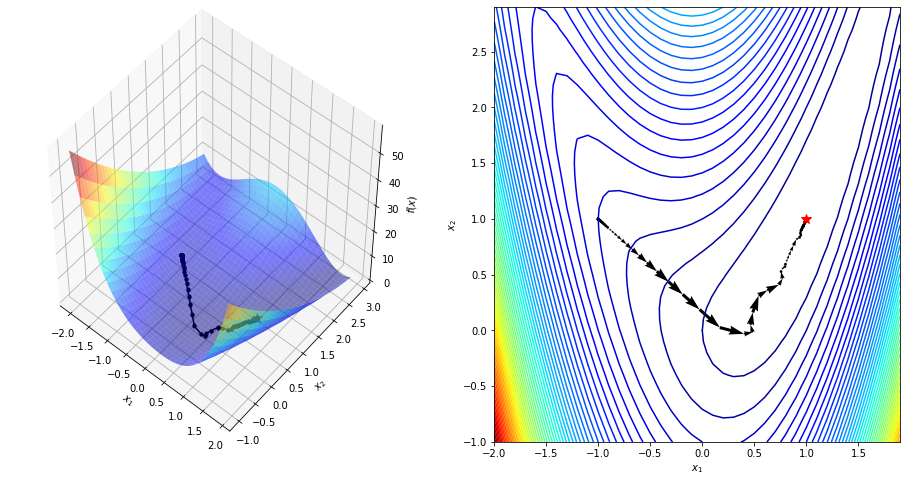

(array([1.00000141, 1.00000277]), 1.988120059799845e-12, 'stopped')

In [60]:
RProp(f=rosen, x=[-1, 1], momentum_type='nesterov', momentum=0.6, verbose=50, plot=True).minimize()

## RMSProp

iter	f(x)		||g(x)||	f(x) - f*	rate
   0	3.0000e+00	1.3153e+01	3.1906e+01
  50	-2.8824e+01	7.0178e-01	8.2502e-02	2.5858e-03
 100	-2.8898e+01	3.7254e-01	8.6753e-03	1.0515e-01
 150	-2.8885e+01	5.8601e-01	2.1463e-02	2.4740e+00
 200	-2.8886e+01	5.6478e-01	1.9936e-02	9.2887e-01
 250	-2.8886e+01	5.6565e-01	1.9997e-02	1.0031e+00
 300	-2.8886e+01	5.6569e-01	2.0001e-02	1.0002e+00
 350	-2.8886e+01	5.6569e-01	2.0000e-02	9.9997e-01
 400	-2.8886e+01	5.6569e-01	2.0000e-02	1.0000e+00
 450	-2.8886e+01	5.6569e-01	2.0000e-02	1.0000e+00
 500	-2.8886e+01	5.6569e-01	2.0000e-02	1.0000e+00
 550	-2.8886e+01	5.6569e-01	2.0000e-02	1.0000e+00
 600	-2.8886e+01	5.6569e-01	2.0000e-02	1.0000e+00
 650	-2.8886e+01	5.6569e-01	2.0000e-02	1.0000e+00
 700	-2.8886e+01	5.6569e-01	2.0000e-02	1.0000e+00
 750	-2.8886e+01	5.6569e-01	2.0000e-02	1.0000e+00
 800	-2.8886e+01	5.6569e-01	2.0000e-02	1.0000e+00
 850	-2.8886e+01	5.6569e-01	2.0000e-02	1.0000e+00
 900	-2.8886e+01	5.6569e-01	2.0000e-02	1.0000e+00
 950	-2.8886e+01	5.6569e-01

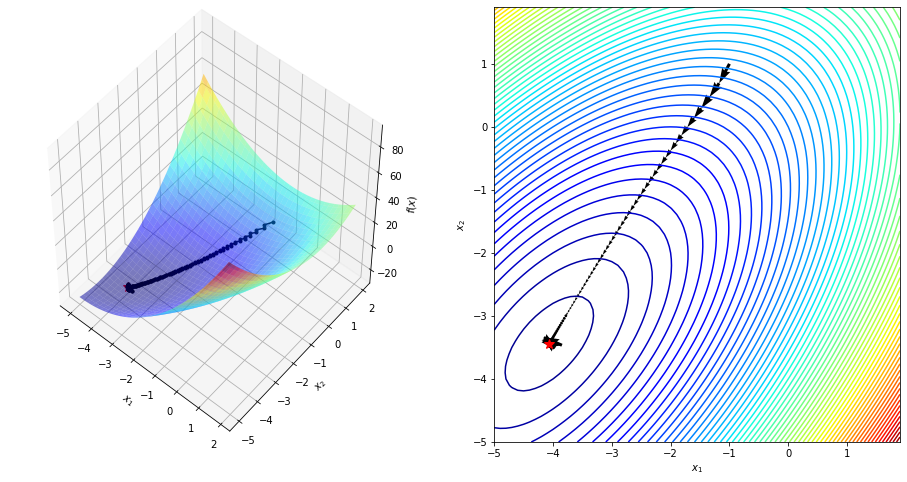

(array([-4.1125, -3.3875]), -28.88625, 'stopped')

In [62]:
RMSProp(f=quad, x=[-1, 1], step_size=0.1, verbose=50, plot=True).minimize()

iter	f(x)		||g(x)||	f(x) - f*	rate
   0	3.0000e+00	1.3153e+01	3.1906e+01
  50	-2.8906e+01	1.0640e-04	2.2910e-09	7.1805e-11
 100	-2.8878e+01	6.7025e-01	2.8077e-02	1.2255e+07
 150	-2.8902e+01	2.6048e-01	4.2407e-03	1.5104e-01
 200	-2.8901e+01	2.8963e-01	5.2427e-03	1.2363e+00
 250	-2.8904e+01	1.7055e-01	1.8180e-03	3.4677e-01
 300	-2.8887e+01	5.6063e-01	1.9644e-02	1.0805e+01
 350	-2.8890e+01	5.0994e-01	1.6253e-02	8.2735e-01
 400	-2.8906e+01	7.4396e-02	3.4593e-04	2.1284e-02
 450	-2.8904e+01	1.9238e-01	2.3130e-03	6.6865e+00
 500	-2.8894e+01	4.4736e-01	1.2508e-02	5.4078e+00
 550	-2.8898e+01	3.6879e-01	8.5006e-03	6.7959e-01
 600	-2.8905e+01	1.2357e-01	9.5431e-04	1.1226e-01
 650	-2.8906e+01	2.3245e-02	3.3770e-05	3.5388e-02
 700	-2.8900e+01	3.1336e-01	6.1371e-03	1.8173e+02
 750	-2.8887e+01	5.5717e-01	1.9403e-02	3.1615e+00
 800	-2.8900e+01	3.1759e-01	6.3038e-03	3.2489e-01
 850	-2.8906e+01	1.0018e-01	6.2727e-04	9.9506e-02
 900	-2.8872e+01	7.3852e-01	3.4088e-02	5.4344e+01
 950	-2.8899e+01	3.5115e-01

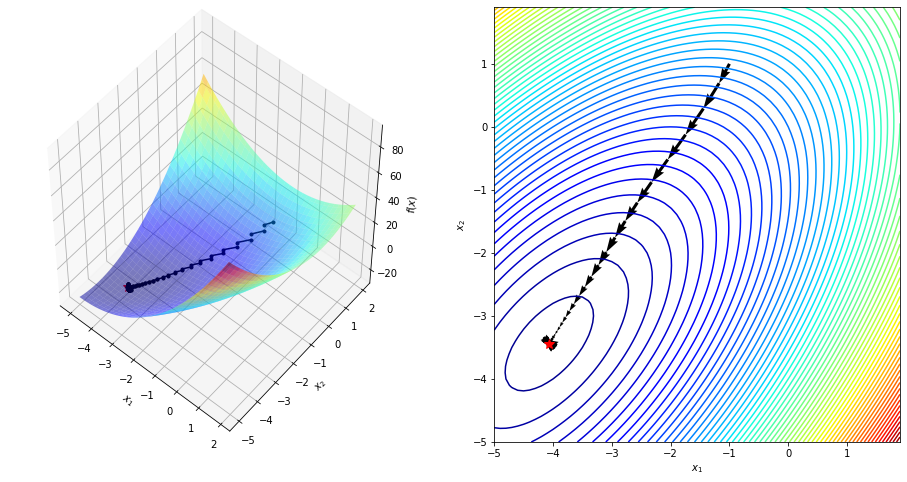

(array([-4.06997676, -3.43002324]), -28.905802784704917, 'stopped')

In [65]:
RMSProp(f=quad, x=[-1, 1], step_size=0.1, momentum_type='standard', momentum=0.6, verbose=50, plot=True).minimize()

iter	f(x)		||g(x)||	f(x) - f*	rate
   0	3.0000e+00	1.3153e+01	3.1906e+01
  50	-2.8906e+01	2.3785e-04	3.8941e-09	1.2205e-10
 100	-2.8901e+01	2.8875e-01	5.2111e-03	1.3382e+06
 150	-2.8899e+01	3.4416e-01	7.4027e-03	1.4206e+00
 200	-2.8898e+01	3.5271e-01	7.7752e-03	1.0503e+00
 250	-2.8898e+01	3.5353e-01	7.8114e-03	1.0047e+00
 300	-2.8898e+01	3.5356e-01	7.8128e-03	1.0002e+00
 350	-2.8898e+01	3.5355e-01	7.8126e-03	9.9997e-01
 400	-2.8898e+01	3.5355e-01	7.8125e-03	9.9999e-01
 450	-2.8898e+01	3.5355e-01	7.8125e-03	1.0000e+00
 500	-2.8898e+01	3.5355e-01	7.8125e-03	1.0000e+00
 550	-2.8898e+01	3.5355e-01	7.8125e-03	1.0000e+00
 600	-2.8898e+01	3.5355e-01	7.8125e-03	1.0000e+00
 650	-2.8898e+01	3.5355e-01	7.8125e-03	1.0000e+00
 700	-2.8898e+01	3.5355e-01	7.8125e-03	1.0000e+00
 750	-2.8898e+01	3.5355e-01	7.8125e-03	1.0000e+00
 800	-2.8898e+01	3.5355e-01	7.8125e-03	1.0000e+00
 850	-2.8898e+01	3.5355e-01	7.8125e-03	1.0000e+00
 900	-2.8898e+01	3.5355e-01	7.8125e-03	1.0000e+00
 950	-2.8898e+01	3.5355e-01

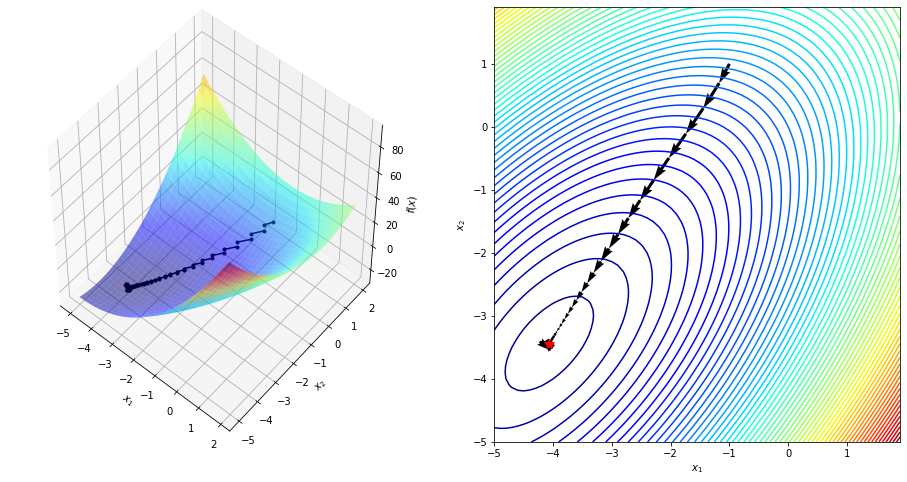

(array([-4.03125, -3.46875]), -28.8984375, 'stopped')

In [67]:
RMSProp(f=quad, x=[-1, 1], step_size=0.1, momentum_type='nesterov', momentum=0.6, verbose=50, plot=True).minimize()

iter	f(x)		||g(x)||	f(x) - f*	rate
   0	4.0000e+00	4.0000e+00	4.0000e+00
  50	2.3421e+00	2.1963e+00	2.3421e+00	5.8554e-01
 100	9.5941e-01	1.9862e+00	9.5941e-01	4.0963e-01
 150	2.7692e-01	9.9319e-01	2.7692e-01	2.8863e-01
 200	2.4481e-02	2.0496e-01	2.4481e-02	8.8408e-02
 250	3.8557e-06	1.7561e-03	3.8557e-06	1.5750e-04
 300	7.0710e-04	1.7534e-01	7.0710e-04	1.8339e+02
 350	4.6183e-04	1.4157e-01	4.6183e-04	6.5313e-01
 400	4.7161e-04	1.4307e-01	4.7161e-04	1.0212e+00
 450	4.7198e-04	1.4313e-01	4.7198e-04	1.0008e+00
 500	4.7191e-04	1.4312e-01	4.7191e-04	9.9984e-01
 550	4.7191e-04	1.4312e-01	4.7191e-04	1.0000e+00
 600	4.7191e-04	1.4312e-01	4.7191e-04	1.0000e+00
 650	4.7191e-04	1.4312e-01	4.7191e-04	1.0000e+00
 700	4.7191e-04	1.4312e-01	4.7191e-04	1.0000e+00
 750	4.7191e-04	1.4312e-01	4.7191e-04	1.0000e+00
 800	4.7191e-04	1.4312e-01	4.7191e-04	1.0000e+00
 850	4.7191e-04	1.4312e-01	4.7191e-04	1.0000e+00
 900	4.7191e-04	1.4312e-01	4.7191e-04	1.0000e+00
 950	4.7191e-04	1.4312e-01	4.7191e-04	1.0000e

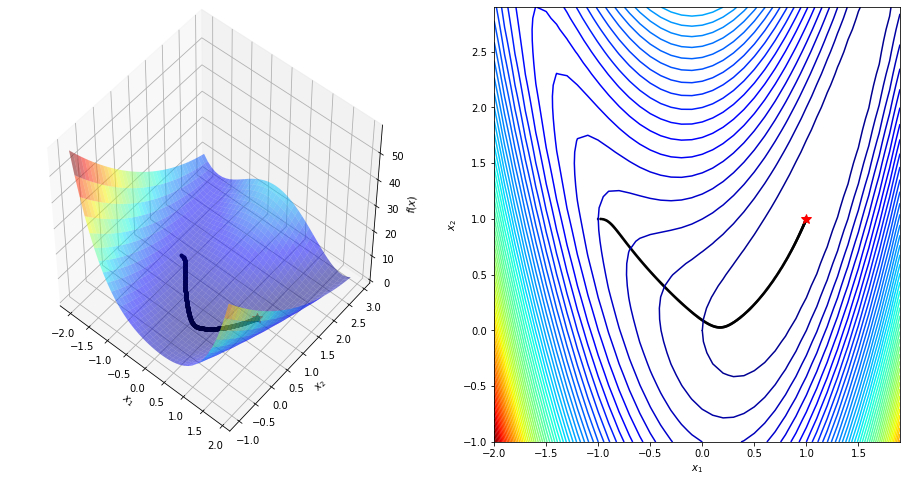

(array([1.00470006, 0.99442521]), 0.00047191061787643516, 'stopped')

In [71]:
RMSProp(f=rosen, x=[-1, 1], step_size=0.01, verbose=50, plot=True).minimize()

iter	f(x)		||g(x)||	f(x) - f*	rate
   0	4.0000e+00	4.0000e+00	4.0000e+00
  50	5.4919e-01	1.4150e+00	5.4919e-01	1.3730e-01
 100	6.8363e-03	8.1525e-02	6.8363e-03	1.2448e-02
 150	2.8638e-05	3.5159e-02	2.8638e-05	4.1891e-03
 200	1.5384e-04	8.1608e-02	1.5384e-04	5.3718e+00
 250	4.5876e-05	4.4494e-02	4.5876e-05	2.9821e-01
 300	1.6975e-04	8.5749e-02	1.6975e-04	3.7003e+00
 350	3.0447e-04	1.1431e-01	3.0447e-04	1.7936e+00
 400	1.1189e-04	6.9593e-02	1.1189e-04	3.6748e-01
 450	2.4693e-05	3.2635e-02	2.4693e-05	2.2069e-01
 500	1.3442e-04	7.6045e-02	1.3442e-04	5.4437e+00
 550	4.7421e-06	1.4268e-02	4.7421e-06	3.5278e-02
 600	6.5824e-04	1.6927e-01	6.5824e-04	1.3881e+02
 650	9.1380e-07	6.2841e-03	9.1380e-07	1.3882e-03
 700	1.5892e-04	8.2958e-02	1.5892e-04	1.7391e+02
 750	6.6524e-05	5.3645e-02	6.6524e-05	4.1860e-01
 800	2.4460e-04	1.0249e-01	2.4460e-04	3.6768e+00
 850	1.0422e-05	2.1139e-02	1.0422e-05	4.2609e-02
 900	1.3063e-04	7.4966e-02	1.3063e-04	1.2534e+01
 950	1.9958e-05	2.9325e-02	1.9958e-05	1.5278e

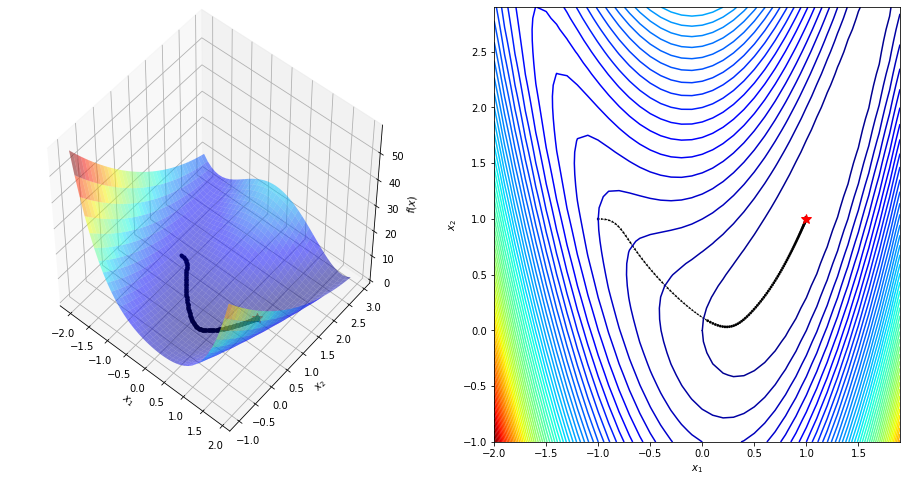

(array([0.99643167, 1.00326458]), 0.0002285750416088555, 'stopped')

In [73]:
RMSProp(f=rosen, x=[-1, 1], step_size=0.01, momentum_type='standard', momentum=0.6, verbose=50, plot=True).minimize()

iter	f(x)		||g(x)||	f(x) - f*	rate
   0	4.0000e+00	4.0000e+00	4.0000e+00
  50	5.4378e-01	1.4192e+00	5.4378e-01	1.3594e-01
 100	6.8062e-03	8.2264e-02	6.8062e-03	1.2516e-02
 150	1.7894e-06	8.7756e-03	1.7894e-06	2.6292e-04
 200	1.1833e-04	7.1385e-02	1.1833e-04	6.6128e+01
 250	1.8206e-04	8.8501e-02	1.8206e-04	1.5385e+00
 300	1.9027e-04	9.0470e-02	1.9027e-04	1.0451e+00
 350	1.9073e-04	9.0577e-02	1.9073e-04	1.0024e+00
 400	1.9070e-04	9.0570e-02	1.9070e-04	9.9986e-01
 450	1.9069e-04	9.0568e-02	1.9069e-04	9.9995e-01
 500	1.9069e-04	9.0568e-02	1.9069e-04	9.9999e-01
 550	1.9069e-04	9.0568e-02	1.9069e-04	1.0000e+00
 600	1.9069e-04	9.0568e-02	1.9069e-04	1.0000e+00
 650	1.9069e-04	9.0568e-02	1.9069e-04	1.0000e+00
 700	1.9069e-04	9.0568e-02	1.9069e-04	1.0000e+00
 750	1.9069e-04	9.0568e-02	1.9069e-04	1.0000e+00
 800	1.9069e-04	9.0568e-02	1.9069e-04	1.0000e+00
 850	1.9069e-04	9.0568e-02	1.9069e-04	1.0000e+00
 900	1.9069e-04	9.0568e-02	1.9069e-04	1.0000e+00
 950	1.9069e-04	9.0568e-02	1.9069e-04	1.0000e

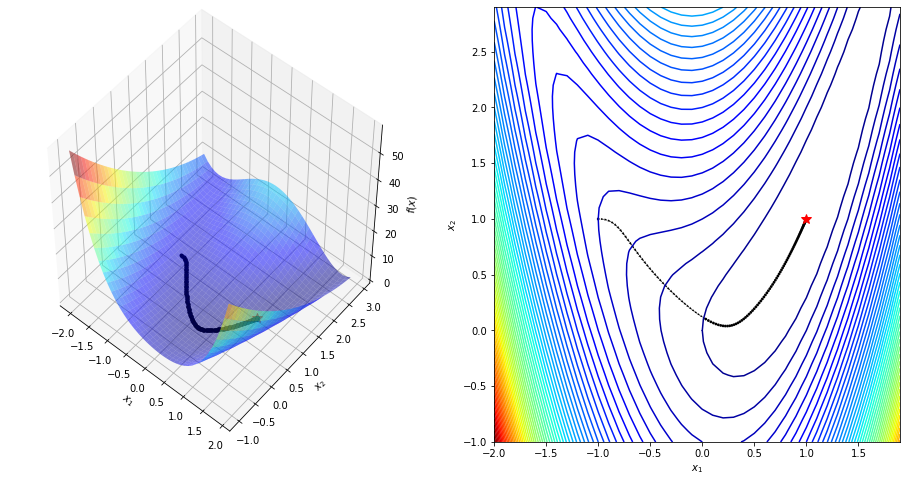

(array([0.99630803, 1.00203864]), 0.00019068758722250243, 'stopped')

In [77]:
RMSProp(f=rosen, x=[-1, 1], step_size=0.01, momentum_type='nesterov', momentum=0.6, verbose=50, plot=True).minimize()